### Problem Statement : Predicting Microsoft Stock Price Movements
       
   Our goal is to forecast whether the stock prices of Microsoft (MSFT) will rise or fall. By analyzing historical data and using predictive models, we aim to provide insights into the direction of future stock movements.

  

In [1]:
#!pip install yfinance

In [253]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")
from pandas.plotting import autocorrelation_plot
from pmdarima import auto_arima
from statsmodels.tsa.stattools import adfuller
import pickle
import math
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA,ARIMAResults
from pmdarima import auto_arima
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import MinMaxScaler

from keras.layers import Dense,Dropout, LSTM
from keras.models import Sequential


import yfinance as yf

# Symbol for Microsoft
symbol = 'MSFT'

# Specify the desired total number of rows
total_rows_to_fetch = 10000

# Initialize an empty DataFrame to store the data
all_data = pd.DataFrame()

# Fetch data in smaller batches
batch_size = 10000  # Adjust this based on your needs

for i in range(0, total_rows_to_fetch, batch_size):
    start_date = "1982-01-01"  # You may adjust the start date
    end_date = "2023-11-17"  # You may adjust the end date

    # Fetch historical data for the current batch
    msft_data = yf.download(symbol, start=start_date, end=end_date)

    # Append the data for the current batch to the overall DataFrame
    all_data = pd.concat([all_data, msft_data])

# Display the number of rows in the final data
print("Number of rows:", len(all_data))

# Save the data to a Pandas DataFrame
df = pd.DataFrame(all_data.reset_index())

# Display the DataFrame
df

df.to_excel('se.xlsx', index=False)
#importing pandas as pd 
import pandas as pd 
  
# Read and store content 
# of an excel file  
read_file = pd.read_excel ("se.xlsx") 
  
# Write the dataframe object 
# into csv file 
read_file.to_csv ("Stock_Price.csv",  
                  index = None, 
                  header=True) 
    
# read csv file and convert  
# into a dataframe object 
df = pd.DataFrame(pd.read_csv("Stock_Price.csv")) 
  
# show the dataframe 
df

In [3]:
msft=pd.read_csv("Stock_Price.csv")
msft

,Date,Open,High,Low,Close,Adj Close,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062427,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063504,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061889,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.060812,47894400
...,...,...,...,...,...,...,...
9493,2023-11-10,361.489990,370.100006,361.070007,369.670013,368.921234,28042100
9494,2023-11-13,368.220001,368.470001,365.899994,366.679993,365.937256,19986500
9495,2023-11-14,371.010010,371.950012,367.350006,370.269989,369.519989,27683900
9496,2023-11-15,371.279999,373.130005,367.109985,369.670013,369.670013,26860100


In [4]:
compare_rmse=[]

### 1. Perform EDA

In [5]:
msft.describe()

,Open,High,Low,Close,Adj Close,Volume
count,9498.000000,9498.000000,9498.000000,9498.000000,9498.000000,9.498000e+03
mean,51.943064,52.500045,51.378119,51.957275,46.434131,5.741976e+07
std,77.070393,77.860698,76.256996,77.093903,77.051338,3.817222e+07
min,0.088542,0.092014,0.088542,0.090278,0.055969,2.304000e+06
25%,5.500000,5.593750,5.429688,5.492188,3.404958,3.311485e+07
50%,27.170000,27.450001,26.945001,27.200001,19.071023,5.057665e+07
75%,45.062500,45.634999,44.592813,45.093750,35.615956,7.129370e+07
max,371.279999,376.350006,370.179993,376.170013,376.170013,1.031789e+09


In [6]:
msft.shape

(9498, 7)

In [7]:
msft.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [8]:
msft.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9498 entries, 0 to 9497
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       9498 non-null   object 
 1   Open       9498 non-null   float64
 2   High       9498 non-null   float64
 3   Low        9498 non-null   float64
 4   Close      9498 non-null   float64
 5   Adj Close  9498 non-null   float64
 6   Volume     9498 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 519.6+ KB


In [9]:
msft.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [10]:
msft.nunique()

Date         9498
Open         5619
High         5553
Low          5574
Close        5767
Adj Close    7392
Volume       9307
dtype: int64

In [11]:
msft['Close'].unique()

array([9.72220004e-02, 1.00694001e-01, 1.02430999e-01, ...,
       3.66679993e+02, 3.70269989e+02, 3.76170013e+02])

### 1.2 Remove Duplicates

In [12]:
msft.duplicated().any()

False

In [13]:
msft.duplicated().sum()


0

### 1.3 Data Imputation

In [14]:
msft['Date']=pd.to_datetime(msft['Date'])

### 1.4 Checking the missing values

In [15]:
msft.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

# Correlation

In [16]:
msft.corr()

,Open,High,Low,Close,Adj Close,Volume
Open,1.000000,0.999935,0.999930,0.999848,0.998443,-0.331863
High,0.999935,1.000000,0.999908,0.999926,0.998490,-0.330581
Low,0.999930,0.999908,1.000000,0.999930,0.998557,-0.333265
Close,0.999848,0.999926,0.999930,1.000000,0.998595,-0.332019
Adj Close,0.998443,0.998490,0.998557,0.998595,1.000000,-0.332516
Volume,-0.331863,-0.330581,-0.333265,-0.332019,-0.332516,1.000000


<Axes: >

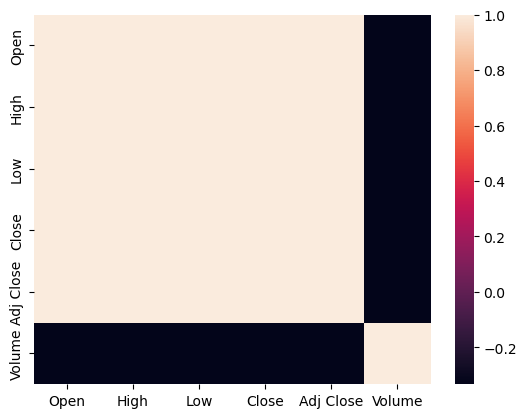

In [17]:
sns.heatmap(msft.corr())

* we conclude that all the attributes except volume are highly correlated therefore we can drop all and only use one attribute for our analysis.

* lets go ahead with close because close is the attribute that has highest correlation with every other attribute

* we can also remove volume as it has -0.332 correlation with 'Close' which is of nearly no use as it won't help in the analysis being negatively correlated

### 2.1 Detecting Outliers/Anomolies

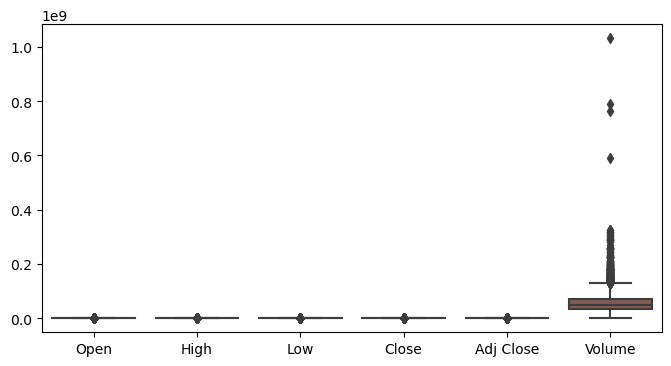

In [18]:
plt.figure(figsize=(8,4))
box = sns.boxplot(data = msft)
plt.show()

#### Conclusion : 

This plot shows that the minimum value is 0 and the maximum is 100 with median around 25.And the interquartile range is around 50. Since the data is mostly in the range 0-50 we can say that it is Heavily Right skewed.


msft=pd.read_csv("Stock_Price.csv")

msft.duplicated().any()

msft['Date']=pd.to_datetime(msft['Date'])
#msft=msft.set_index("Date",drop=True)

msft.head(1)

msft.drop(columns=['Open','High','Low',"Adj Close",'Volume'],inplace=True)

msft.isnull().any()

# treating outliers monthly

In [19]:
#groupby your key and freq
g=msft.groupby(pd.Grouper(key='Date',freq='M'))
g

#grouops to a list of dataframe with list compariosn
dfs=[group for _,group in g]
dfs

[         Date      Open      High       Low     Close  Adj Close      Volume
 0  1986-03-13  0.088542  0.101563  0.088542  0.097222   0.060274  1031788800
 1  1986-03-14  0.097222  0.102431  0.097222  0.100694   0.062427   308160000
 2  1986-03-17  0.100694  0.103299  0.100694  0.102431   0.063504   133171200
 3  1986-03-18  0.102431  0.103299  0.098958  0.099826   0.061889    67766400
 4  1986-03-19  0.099826  0.100694  0.097222  0.098090   0.060812    47894400
 5  1986-03-20  0.098090  0.098090  0.094618  0.095486   0.059198    58435200
 6  1986-03-21  0.095486  0.097222  0.091146  0.092882   0.057584    59990400
 7  1986-03-24  0.092882  0.092882  0.089410  0.090278   0.055969    65289600
 8  1986-03-25  0.090278  0.092014  0.089410  0.092014   0.057045    32083200
 9  1986-03-26  0.092014  0.095486  0.091146  0.094618   0.058660    22752000
 10 1986-03-27  0.094618  0.096354  0.094618  0.096354   0.059736    16848000
 11 1986-03-31  0.096354  0.096354  0.093750  0.095486   0.05919

In [20]:
for i in range(len(g.groups)) :
    dfs[i]['Date']=pd.to_datetime(dfs[i]['Date'])

In [21]:
for i in range(len(g.groups)):
    dfs[i]=dfs[i].set_index('Date',drop=True)
dfs

[                Open      High       Low     Close  Adj Close      Volume
 Date                                                                     
 1986-03-13  0.088542  0.101563  0.088542  0.097222   0.060274  1031788800
 1986-03-14  0.097222  0.102431  0.097222  0.100694   0.062427   308160000
 1986-03-17  0.100694  0.103299  0.100694  0.102431   0.063504   133171200
 1986-03-18  0.102431  0.103299  0.098958  0.099826   0.061889    67766400
 1986-03-19  0.099826  0.100694  0.097222  0.098090   0.060812    47894400
 1986-03-20  0.098090  0.098090  0.094618  0.095486   0.059198    58435200
 1986-03-21  0.095486  0.097222  0.091146  0.092882   0.057584    59990400
 1986-03-24  0.092882  0.092882  0.089410  0.090278   0.055969    65289600
 1986-03-25  0.090278  0.092014  0.089410  0.092014   0.057045    32083200
 1986-03-26  0.092014  0.095486  0.091146  0.094618   0.058660    22752000
 1986-03-27  0.094618  0.096354  0.094618  0.096354   0.059736    16848000
 1986-03-31  0.096354  0.

In [22]:
import copy
dfs_cap=copy.deepcopy(dfs)

In [23]:

for i in range(len(g.groups)):
    #for Close
    #finding IQR
    percentile25_close=dfs[i]['Close'].quantile(0.25)
    percentile75_close=dfs[i]['Close'].quantile(0.75)
    iqr_close=percentile75_close - percentile25_close
    upper_limit_close=percentile75_close + 1.5 * iqr_close
    lower_limit_close=percentile25_close - 1.5 * iqr_close
    #find outliers
    outliers_close=dfs[i][(dfs[i]['Close']> upper_limit_close)]
    #capping
    dfs_cap[i]['Close']=np.where(
    dfs_cap[i]['Close']>upper_limit_close,
    upper_limit_close,
    np.where(
    dfs_cap[i]['Close']<lower_limit_close,lower_limit_close,dfs_cap[i]['Close']))
    
    #for Adj Close
    #finding IQR
    percentile25_Adjclose=dfs[i]['Adj Close'].quantile(0.25)
    percentile75_Adjclose=dfs[i]['Adj Close'].quantile(0.75)
    iqr_Adjclose=percentile75_Adjclose - percentile25_Adjclose
    upper_limit_Adjclose=percentile75_Adjclose + 1.5 * iqr_Adjclose
    lower_limit_Adjclose=percentile25_Adjclose - 1.5 * iqr_Adjclose
    #find outliers
    outliers_Adjclose=dfs[i][(dfs[i]['Adj Close']> upper_limit_Adjclose)]
    #capping
    dfs_cap[i]['Adj Close']=np.where(
    dfs_cap[i]['Adj Close']>upper_limit_Adjclose,
    upper_limit_Adjclose,
    np.where(
    dfs_cap[i]['Adj Close']<lower_limit_Adjclose,lower_limit_Adjclose,dfs_cap[i]['Adj Close']))
    
    #for Open
    #finding IQR
    percentile25_Open=dfs[i]['Open'].quantile(0.25)
    percentile75_Open=dfs[i]['Open'].quantile(0.75)
    iqr_Open=percentile75_Open - percentile25_Open
    upper_limit_Open=percentile75_Open + 1.5 * iqr_Open
    lower_limit_Open=percentile25_Open - 1.5 * iqr_Open
    #find outliers
    outliers_Open=dfs[i][(dfs[i]['Open']> upper_limit_Open)]
    #capping
    dfs_cap[i]['Open']=np.where(
    dfs_cap[i]['Open']>upper_limit_Open,
    upper_limit_Open,
    np.where(
    dfs_cap[i]['Open']<lower_limit_Open,lower_limit_Open,dfs_cap[i]['Open']))
    
     #for High
    #finding IQR
    percentile25_High=dfs[i]['High'].quantile(0.25)
    percentile75_High=dfs[i]['High'].quantile(0.75)
    iqr_High=percentile75_High - percentile25_High
    upper_limit_High=percentile75_High + 1.5 * iqr_High
    lower_limit_High=percentile25_High - 1.5 * iqr_High
    #find outliers
    outliers_High=dfs[i][(dfs[i]['High']> upper_limit_High)]
    #capping
    dfs_cap[i]['High']=np.where(
    dfs_cap[i]['High']>upper_limit_High,
    upper_limit_High,
    np.where(
    dfs_cap[i]['High']<lower_limit_High,lower_limit_High,dfs_cap[i]['High']))
    
      #for Low
    #finding IQR
    percentile25_Low=dfs[i]['Low'].quantile(0.25)
    percentile75_Low=dfs[i]['Low'].quantile(0.75)
    iqr_Low=percentile75_Low - percentile25_Low
    upper_limit_Low=percentile75_Low + 1.5 * iqr_Low
    lower_limit_Low=percentile25_Low - 1.5 * iqr_Low
    #find outliers
    outliers_Low=dfs[i][(dfs[i]['Low']> upper_limit_Low)]
    #capping
    dfs_cap[i]['Low']=np.where(
    dfs_cap[i]['Low']>upper_limit_Low,
    upper_limit_Low,
    np.where(
    dfs_cap[i]['Low']<lower_limit_Low,lower_limit_Low,dfs_cap[i]['Low']))






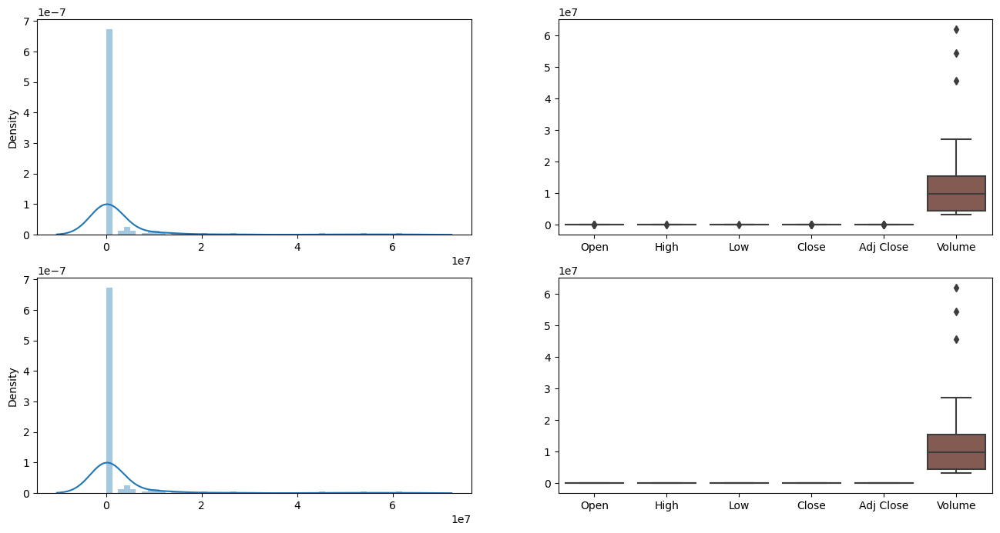

In [24]:
#comparing
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(dfs[2])

plt.subplot(2,2,2)
sns.boxplot(dfs[2])

plt.subplot(2,2,3)
sns.distplot(dfs_cap[2])

plt.subplot(2,2,4)
sns.boxplot(dfs_cap[2])

plt.show()

In [25]:
for i in range(len( dfs_cap)):
    dfs_cap[i]=dfs_cap[i].reset_index('Date')
dfs_cap

[         Date      Open      High       Low     Close  Adj Close      Volume
 0  1986-03-13  0.088542  0.101563  0.088542  0.097222   0.060274  1031788800
 1  1986-03-14  0.097222  0.102431  0.097222  0.100694   0.062427   308160000
 2  1986-03-17  0.100694  0.103299  0.100694  0.102431   0.063504   133171200
 3  1986-03-18  0.102431  0.103299  0.098958  0.099826   0.061889    67766400
 4  1986-03-19  0.099826  0.100694  0.097222  0.098090   0.060812    47894400
 5  1986-03-20  0.098090  0.098090  0.094618  0.095486   0.059198    58435200
 6  1986-03-21  0.095486  0.097222  0.091146  0.092882   0.057584    59990400
 7  1986-03-24  0.092882  0.092882  0.089410  0.090278   0.055969    65289600
 8  1986-03-25  0.090278  0.092014  0.089410  0.092014   0.057045    32083200
 9  1986-03-26  0.092014  0.095486  0.091146  0.094618   0.058660    22752000
 10 1986-03-27  0.094618  0.096354  0.094618  0.096354   0.059736    16848000
 11 1986-03-31  0.096354  0.096354  0.093750  0.095486   0.05919

In [26]:
msft=pd.DataFrame(np.concatenate(dfs_cap),columns=['Date','Open','High','Low','Close','AdjClose','Volume'])
msft

,Date,Open,High,Low,Close,AdjClose,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062427,308160000
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063504,133171200
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061889,67766400
4,1986-03-19,0.099826,0.100694,0.097222,0.09809,0.060812,47894400
...,...,...,...,...,...,...,...
9493,2023-11-10,361.48999,370.100006,361.070007,369.670013,368.921234,28042100
9494,2023-11-13,368.220001,368.470001,365.899994,366.679993,365.937256,19986500
9495,2023-11-14,371.01001,371.950012,367.350006,370.269989,369.519989,27683900
9496,2023-11-15,371.279999,373.130005,367.109985,369.670013,369.670013,26860100


In [27]:
msft[['Open','High','Low','Close','AdjClose']]=msft[['Open','High','Low','Close','AdjClose']].astype('float')

In [28]:
msft.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9498 entries, 0 to 9497
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      9498 non-null   datetime64[ns]
 1   Open      9498 non-null   float64       
 2   High      9498 non-null   float64       
 3   Low       9498 non-null   float64       
 4   Close     9498 non-null   float64       
 5   AdjClose  9498 non-null   float64       
 6   Volume    9498 non-null   object        
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 519.6+ KB


In [29]:
msft.isnull().any()

Date        False
Open        False
High        False
Low         False
Close       False
AdjClose    False
Volume      False
dtype: bool

In [30]:
#msft.drop(columns=['Date'],axis=1,inplace=True)
msft.head(1)

,Date,Open,High,Low,Close,AdjClose,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800


In [31]:
msft['Date']=pd.to_datetime(msft['Date'])

In [32]:
msft.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9498 entries, 0 to 9497
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      9498 non-null   datetime64[ns]
 1   Open      9498 non-null   float64       
 2   High      9498 non-null   float64       
 3   Low       9498 non-null   float64       
 4   Close     9498 non-null   float64       
 5   AdjClose  9498 non-null   float64       
 6   Volume    9498 non-null   object        
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 519.6+ KB


### 1.1 Remove unwanted columns

In [33]:
df1 = msft[['Date', 'Close']]
df1

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


In [34]:
df2=df1.copy()

### 2. Data visualization

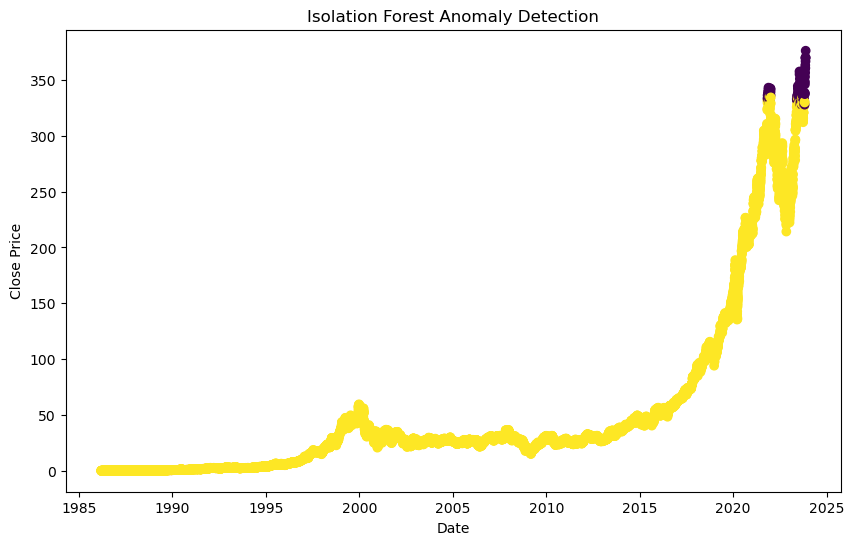

In [35]:
from sklearn.ensemble import IsolationForest  # Import the IsolationForest class
import matplotlib.pyplot as plt

df2['Date'] = pd.to_datetime(df2['Date'])


features = ['Close']   # Train the Isolation Forest model
X_train = df1[features].values

# A contamination value based on the expected proportion of outliers in your data

contamination = 0.01

model = IsolationForest(contamination=contamination, random_state=42)
model.fit(X_train)

# Predict outliers (anomalies)
df2['anomaly'] = model.predict(X_train)

# Plot the results
plt.figure(figsize=(10, 6))
plt.scatter(df2['Date'], df2['Close'], c=df2['anomaly'], cmap='viridis')
plt.title('Isolation Forest Anomaly Detection')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.show()

#### Conclusion :

Yellow Points: These are the data points that the Isolation Forest algorithm considers normal or inliers.

Purple Points: These are the data points that the Isolation
Forest algorithm identifies as anomalies or outliers.

For default contamination level of 1 percent , but we are not removing
any data because removing any data will cause model prediction error.

From this closely clustered datapoints we can see there is a clear trend in the data.

In [36]:
df2

,Date,Close,anomaly
0,1986-03-13,0.097222,1
1,1986-03-14,0.100694,1
2,1986-03-17,0.102431,1
3,1986-03-18,0.099826,1
4,1986-03-19,0.098090,1
...,...,...,...
9493,2023-11-10,369.670013,-1
9494,2023-11-13,366.679993,-1
9495,2023-11-14,370.269989,-1
9496,2023-11-15,369.670013,-1


### 2.2 Trend and Seasonality in The Dataset 

In [37]:
msft.head(1)

,Date,Open,High,Low,Close,AdjClose,Volume
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800


In [38]:
df=msft.drop(columns=['Volume'])
df.head(1)

,Date,Open,High,Low,Close,AdjClose
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274


In [39]:
df['Date']=pd.to_datetime(df['Date'])

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9498 entries, 0 to 9497
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      9498 non-null   datetime64[ns]
 1   Open      9498 non-null   float64       
 2   High      9498 non-null   float64       
 3   Low       9498 non-null   float64       
 4   Close     9498 non-null   float64       
 5   AdjClose  9498 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 445.3 KB


In [41]:
df.rename({'Adj Close':'AdjClose'},inplace=True)

In [42]:
from statsmodels.tsa.seasonal import STL 
data = df.copy()
data.set_index("Date", inplace=True)
data = data[['Close']]

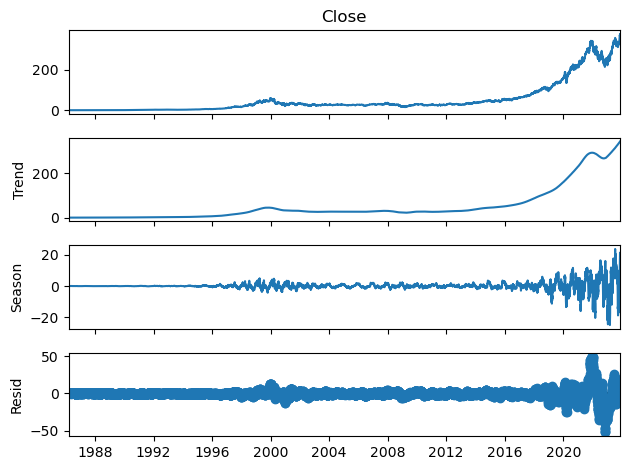

In [43]:
#This code appears to be using the STL (Seasonal-Trend decomposition using LOESS) method from the 
#statsmodels library to decompose a time series into its trend, seasonal, and residual components. 
#Here's a breakdown of the code:

endog = data['Close']
res = STL(endog, period=252).fit() #period=252 for business days
res.plot()
plt.show()

### 2.3 Subplot

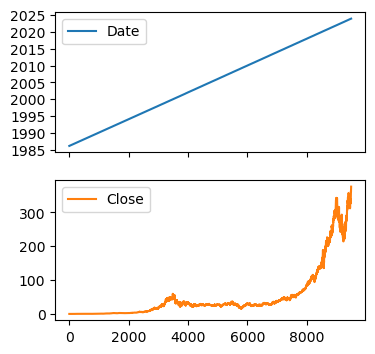

In [44]:
df1.plot(subplots=True, figsize=(4, 4))
plt.show()

### Conclusion :

This plots , first one shows Closing value increases with respect to year and second one with respect to Days and Closing value.

### 2.4 Plotting the Changes in Data with reference to previous data percentage

[]

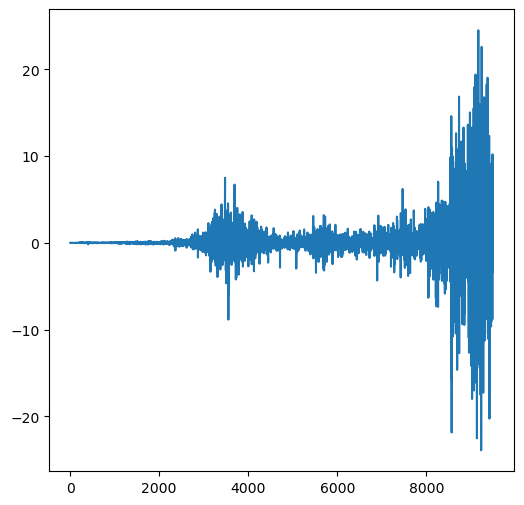

In [45]:
df1.Close.diff(2).plot(figsize=(6, 6))
plt.plot()

### Conclusion :

This plot shows the percentage difference of Closing value of this day to previous day. From the graph we can see that, during the last decade the closing price in consicutive days differs in large percentages.

### 2.5 Plotting the Changes in Data with reference to difference of previous data

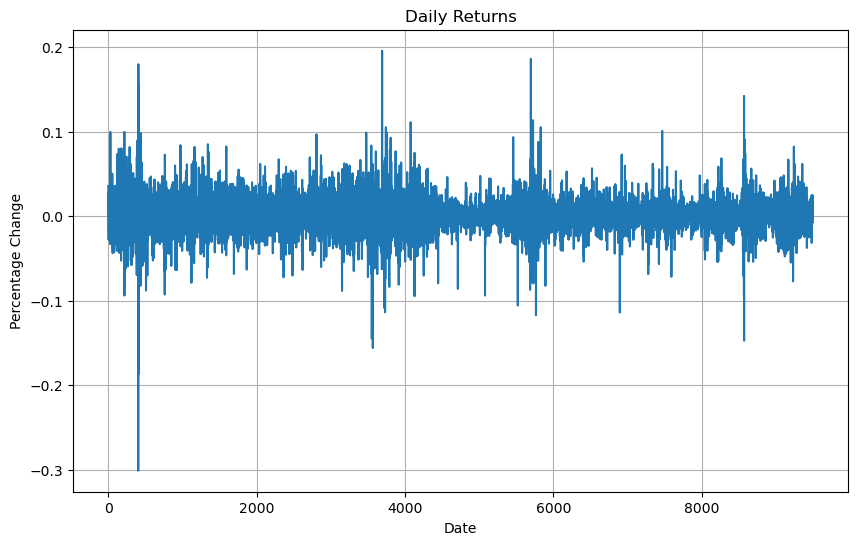

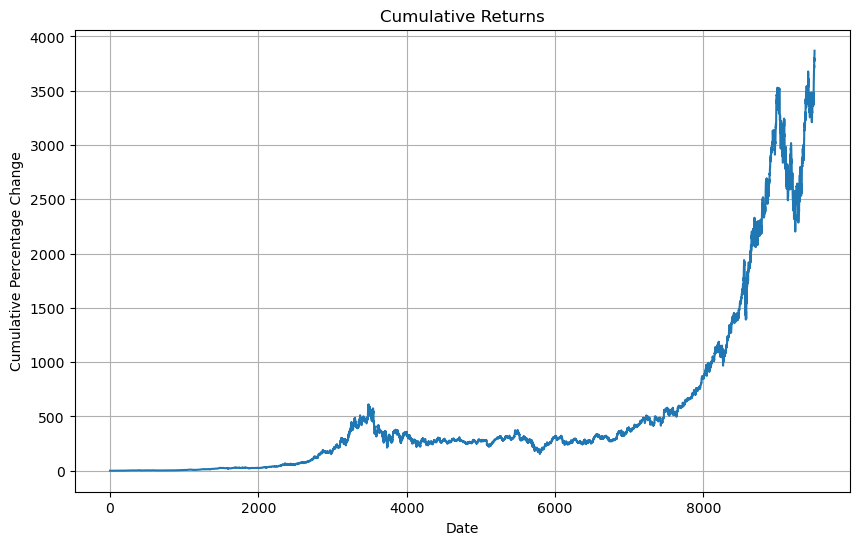

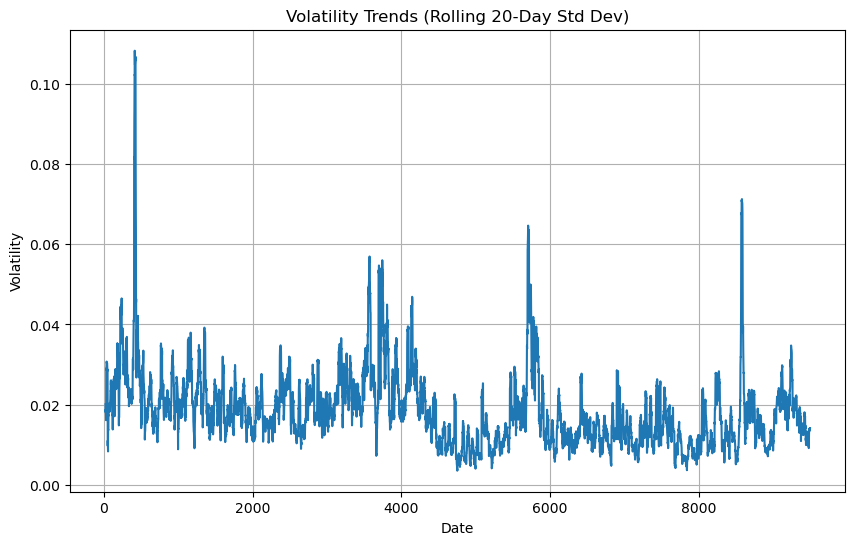

In [46]:
df1['Close'] = pd.to_numeric(df1['Close'], errors='coerce')

# Calculate Daily Returns
df1['Daily_Return'] = df1['Close'].pct_change()

# Plot Daily Returns
plt.figure(figsize=(10, 6))
df1['Daily_Return'].plot(title='Daily Returns', xlabel='Date', ylabel='Percentage Change', grid=True)
plt.show()

# Calculate Cumulative Returns
df1['Cumulative_Return'] = (1 + df1['Daily_Return']).cumprod() - 1

# Plot Cumulative Returns
plt.figure(figsize=(10, 6))
df1['Cumulative_Return'].plot(title='Cumulative Returns', xlabel='Date', ylabel='Cumulative Percentage Change', grid=True)
plt.show()

# Calculate and Plot Volatility Trends using Rolling Standard Deviation
window_size = 20  
df1['Volatility'] = df1['Daily_Return'].rolling(window=window_size).std()

plt.figure(figsize=(10, 6))
df1['Volatility'].plot(title=f'Volatility Trends (Rolling {window_size}-Day Std Dev)', xlabel='Date', ylabel='Volatility', grid=True)
plt.show()


### Conclusion :

Here 

1.Daily Returns:

Calculated using the percentage change in the 'Close' prices from one day to the next.

2.Cumulative Returns:

Cumulative returns are calculated as the cumulative percentage of daily returns.Here Cumulative return is gradually increasing. clearly there is a positive trend in the long run.

3.Volatility Trends:

Volatility is calculated using the rolling standard deviation of daily returns, providing insights into the fluctuation in the stock prices.
Here the market is always in volatile and sometimes extreme.

In [47]:
df1 = df1[['Date', 'Close']]
# Convert 'Date' to datetime format
df1['Date'] = pd.to_datetime(df1['Date'])
df1

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


### 2.6 Line Plot and Bar Plot

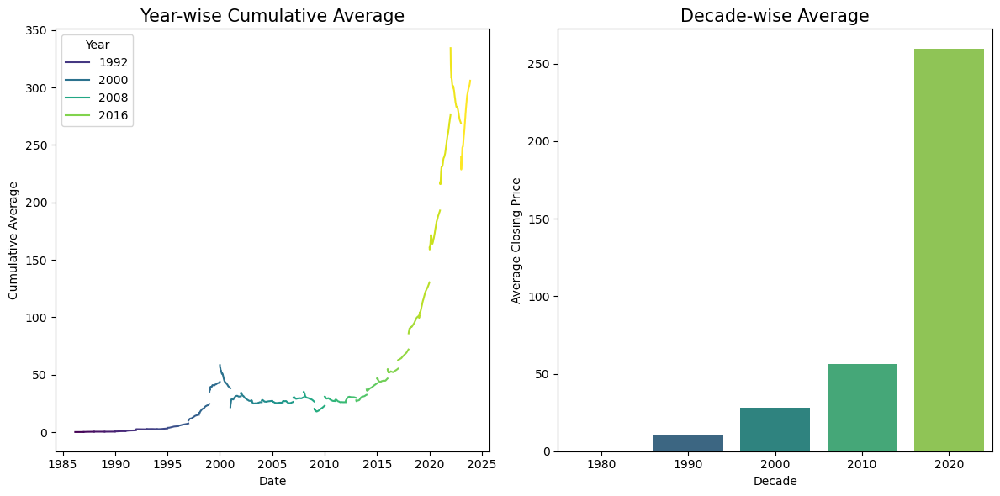

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df1['Date'] = pd.to_datetime(df1['Date'])
# Extract 'Year' and 'Decade'
df1['Year'] = df1['Date'].dt.year
df1['Decade'] = (df1['Year'] // 10) * 10

# Calculate year-wise cumulative average and decade-wise average
df1['YearlyCumulativeAvg'] = df1.groupby('Year')['Close'].cumsum() / (df1.groupby('Year').cumcount() + 1)
df1['DecadeAvg'] = df1.groupby('Decade')['Close'].transform('mean')

# Plotting
plt.figure(figsize=(12, 6))

# Year-wise cumulative average
plt.subplot(1, 2, 1)
sns.lineplot(x='Date', y='YearlyCumulativeAvg', data=df1, hue='Year', palette='viridis')
plt.title('Year-wise Cumulative Average', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Cumulative Average')
plt.legend(title='Year')

# Decade-wise average
plt.subplot(1, 2, 2)
sns.barplot(x='Decade', y='DecadeAvg', data=df1, palette='viridis', ci=None)
plt.title('Decade-wise Average', fontsize=15)
plt.xlabel('Decade')
plt.ylabel('Average Closing Price')

plt.tight_layout()
plt.show()

### Conclusion :

Plot 1 says about cumulative average of all stock prices in a year and it is gradually increasing till 2015 and then there is a rapid increase after that.

Plot 2 says the decade wise increase of stock price. We can see from the graph that there is a great difference in the closing prices of last decade with respect to previous decades.

### 2.7 Scatter plot For Data Visualization

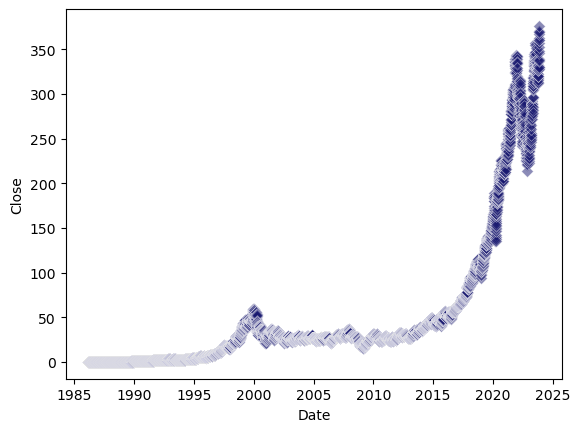

In [49]:
# importing packages
import seaborn as sns
import matplotlib.pyplot as plt
 
 
sns.scatterplot( x="Date", y='Close', data=df1, color='midnightblue', alpha=0.5, edgecolors='cyan', 
            marker='D') 
plt.show()

### Conclusion : 

Same data Closing price prediction in Scatter plot.

In [50]:
import matplotlib.dates as mdates

In [51]:
df1.drop(['Year', 'Decade', 'YearlyCumulativeAvg', 'DecadeAvg'], axis=1, inplace=True)

In [52]:
# Set 'Date' column as the index
df1.set_index('Date',inplace=True)

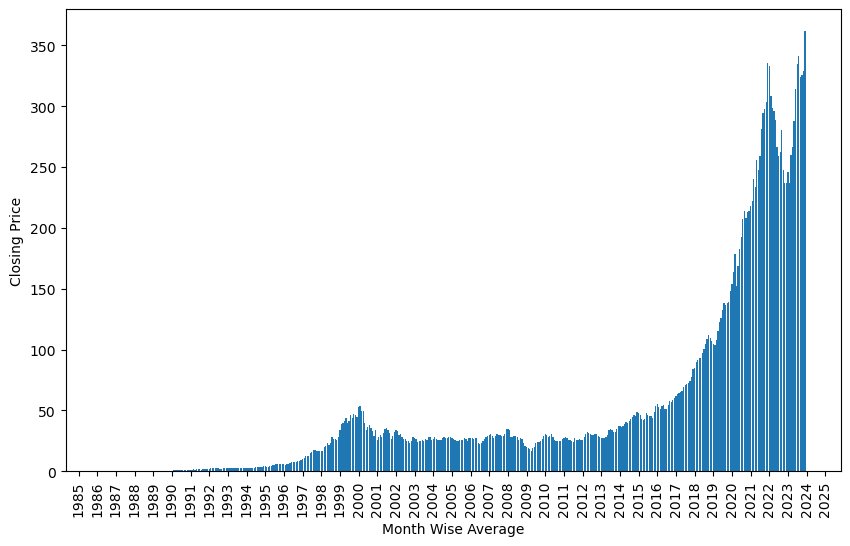

In [53]:



# Resampling the time series data based on monthly 'M' frequency
df1_month = df1.resample("M").mean()

# Using subplot
fig, ax = plt.subplots(figsize=(10, 6))
plt.xticks(rotation=90,
            fontsize=10
            )

# Plotting bar graph
ax.bar(df1_month.index, df1_month["Close"], width=25, align='center')

# Formatting x-axis for better readability (optional)
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.xlabel('Month Wise Average')
plt.ylabel('Closing Price')
plt.show()

### Conclusion : 

Same Closing range in bar plot with taking month wise average.

### 2.8 Plotting the pivot chart:

[]

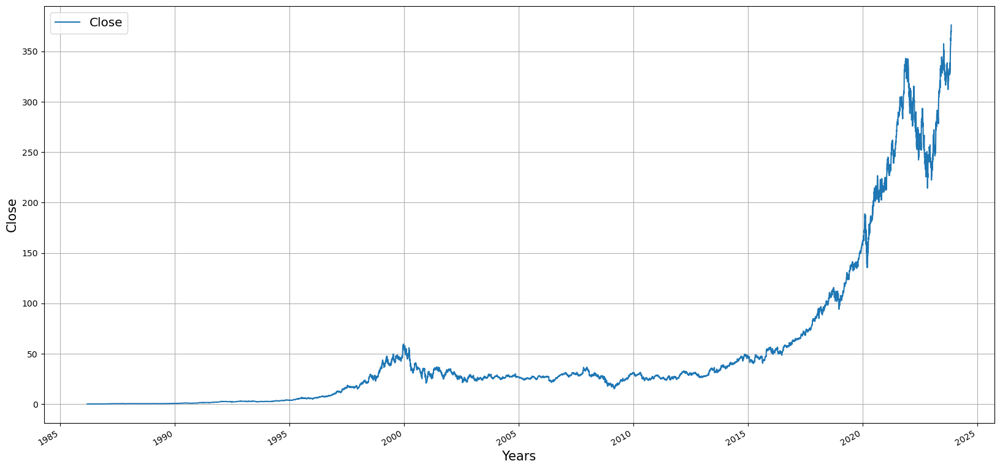

In [54]:
import pandas as pd

# Assuming 'Year' is a column in your DataFrame df1
years = pd.pivot_table(data=df1, values="Close", index="Date")

years.plot(figsize=(20,10))
plt.grid()
plt.legend(loc='best');
plt.xlabel('Years',fontsize=15)
plt.ylabel('Close',fontsize=15)
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.legend(fontsize="x-large")
plt.plot()

### Conclusion :

Pivot tables are used for summarizing and rearranging large amounts of data into an easier-to-understand table that allows us to draw important business conclusions.

This table is summerising & rearrenging the larg amount of data

### 2.9 Plotting the Empirical Cumulative Distribution :

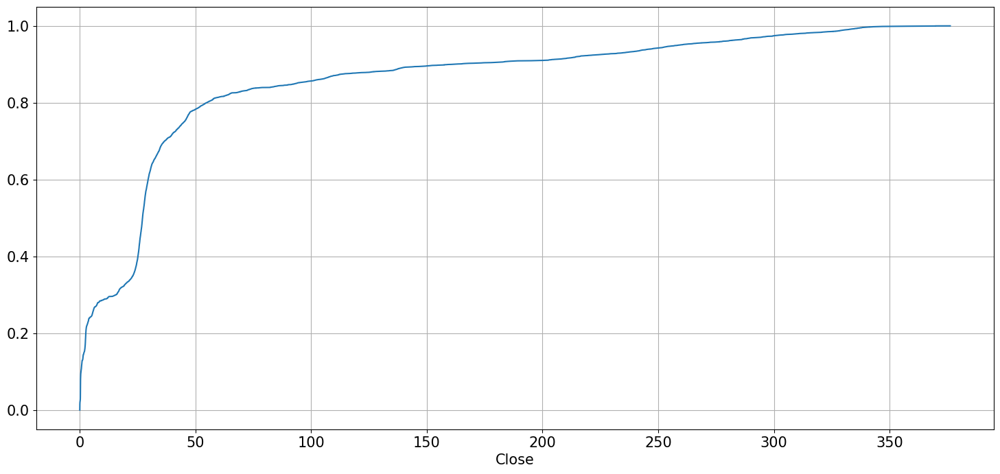

In [55]:
from statsmodels.distributions.empirical_distribution import ECDF
plt.figure(figsize = (18, 8))
cdf = ECDF(df1['Close'])
plt.plot(cdf.x, cdf.y, label = "statmodels");
plt.grid()
plt.rc('xtick',labelsize=15)
plt.rc('ytick',labelsize=15)
plt.xlabel('Close', fontsize = 15);

### Conclusion :

Probablity of prices in closing range and it shows it is steadily increasing.it avoids the potential error of inappropriate distribution fits.

### 2.10 Yearly plot

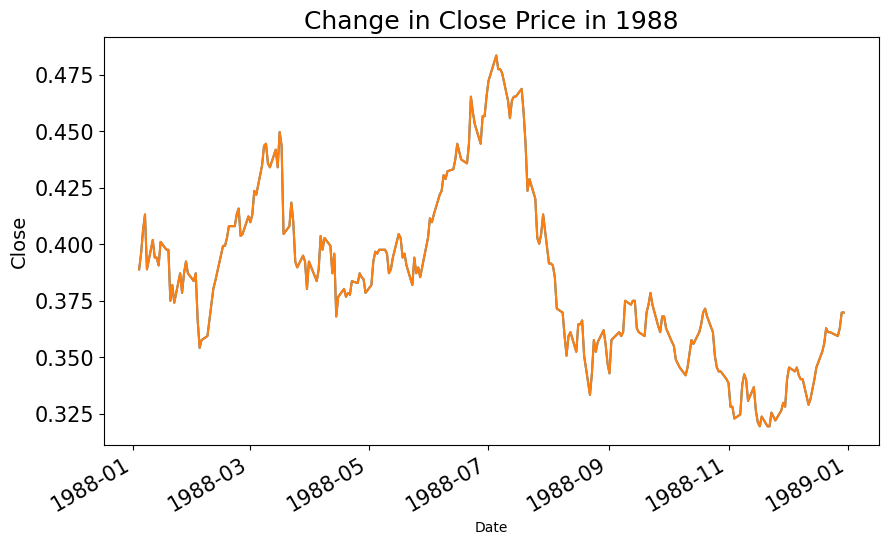

In [56]:
# Filter the DataFrame for the year 1988
df1_1988 = df1['1988-01-01':'1988-12-31']

# Plot the 'Close' column for the year 1988
df1_1988['Close'].plot(figsize=(10, 6))
# Filter the DataFrame for the year 1988
df1_1988 = df1['1988-01-01':'1988-12-31']

# Plot the 'Close' column for the year 1988
df1_1988['Close'].plot(figsize=(10, 6))
plt.title('Change in Close Price in 1988', fontsize=18)
plt.ylabel('Close', fontsize=14)
plt.show()

### Conclusion :

This plot shows the Closing values for the year 1988.

### 2.11 Yearly  Scatter Box Plot in Time Series Dataset :

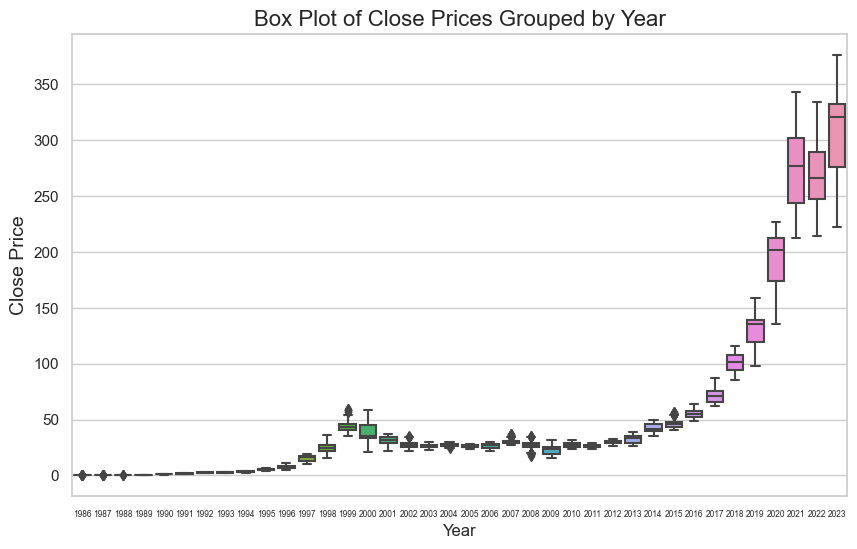

In [57]:
# Extract year from the index (assuming the index is in datetime format)
df1["Year"] = df1.index.year

# Box plot grouped by year
sns.set(style="whitegrid")  # Optional: Set Seaborn style
plt.figure(figsize=(10, 6))

# Create a box plot
boxplot = sns.boxplot(data=df1, x="Year", y="Close")

# Set x-axis label font size
boxplot.tick_params(axis='x', labelsize=6)

# Set plot title and y-axis label
plt.title('Box Plot of Close Prices Grouped by Year', fontsize=16)
plt.ylabel('Close Price', fontsize=14)

plt.show()

### Conclusion :

This boxplot shows the yearwise boxplot with median,minimum and maximum value.
There are no outliers for the last few years compared to the privious years.

### 2.12 PACF and ACF plots

In [58]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

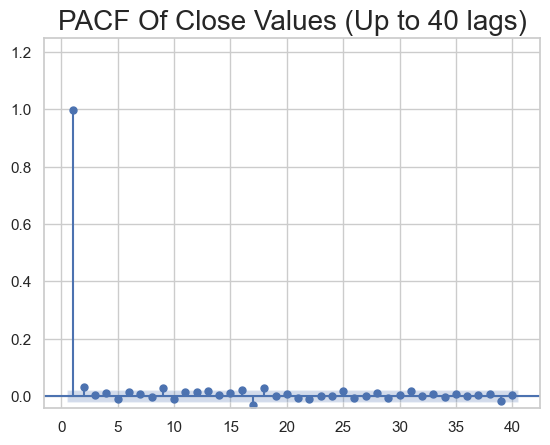

In [59]:
df1['Close'] = pd.to_numeric(df1['Close'], errors='coerce')
df1.index = pd.to_datetime(df1.index)   # Ensure the index is in datetime format
max_lags = 40   # Plot PACF for a subset of lags (e.g., 100)
plot_pacf(df1['Close'], lags=min(max_lags, len(df1) - 1), zero=False, auto_ylims=True)
plt.title(f"PACF Of Close Values (Up to {max_lags} lags)", size=20)
plt.show()

### Conclusion :

In time series analysis, the partial autocorrelation function (PACF) gives the partial correlation of a stationary time series with its own lagged values, regressed the values of the time series at all shorter lags.

This shows the Stock market rate at both ends are at different levels and hence there is a huge gap in PACF plot .It does not compare with previous value, instead it will compare with a
reference point.

<Figure size 800x400 with 0 Axes>

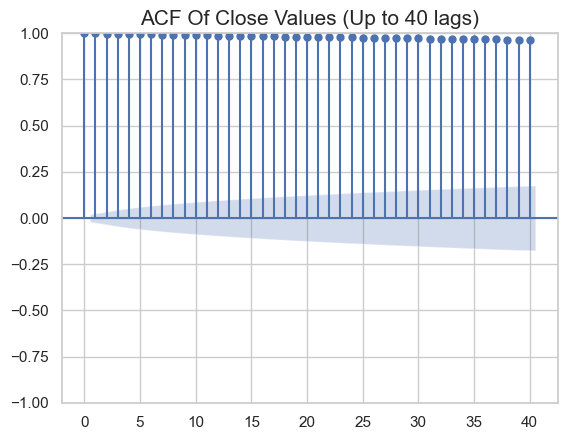

In [60]:
max_lags = 40 # Set the maximum number of lags
plt.figure(figsize=(8, 4))   # Plot ACF
plot_acf(df1['Close'], lags=min(max_lags, len(df1) - 1), zero=True)
plt.title(f"ACF Of Close Values (Up to {max_lags} lags)", size=15)
plt.show()

### Conclusion :

The autocorrelation function (ACF) defines how data points in a time series are related, on average, to the preceding data points.

From the graph it's clear that the data points are highly related on average to the preceding data points.

In [61]:
df1.head(1)

,Close,Year
Date,,
1986-03-13,0.097222,1986


In [62]:

df1.drop(columns=['Year'],inplace=True)
df1.head()

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090


<Axes: xlabel='Date'>

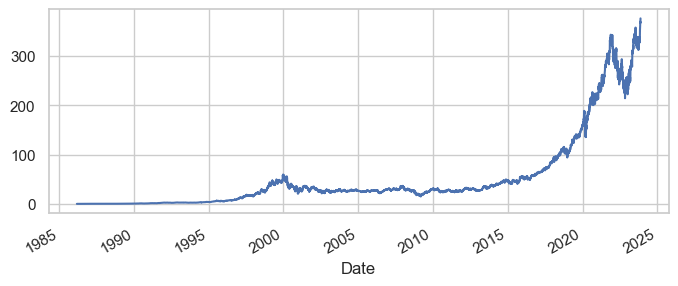

In [63]:
df1['Close'].plot(figsize=(8,3))

* the trend for open started to increase after around 2015 and kept on increasing but started to drop may be aroung 2021 which might be due to pandemic and again it started to grow...lets check the data flow around 2021

<Axes: xlabel='Date'>

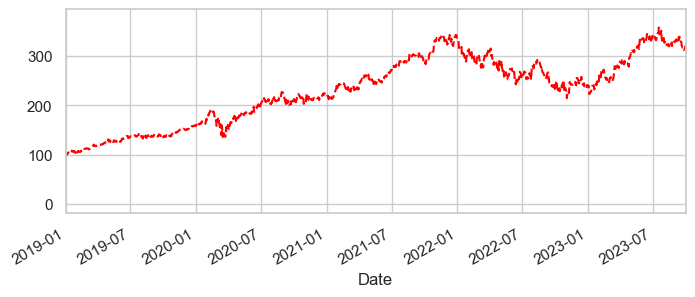

In [64]:
df1["Close"].plot(xlim=['2019-01-01','2023-10-01'],figsize=(8,3),color='red',linestyle='--')

* lets focus from 2021-07 to 2023-07

<Axes: xlabel='Date'>

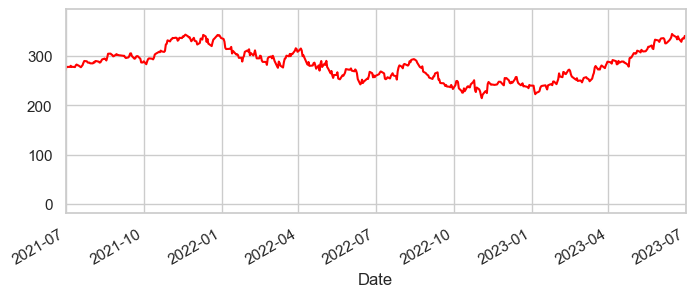

In [65]:
df1["Close"].plot(xlim=['2021-07-01','2023-07-01'],figsize=(8,3),color='red')

* we can see there was rise in opening market from april of 2023 which kept on increasing 

# resampling


In [66]:
df1.resample(rule='A').min() # year end frequency...data end of the year


,Close
Date,
1986-12-31,0.090278
1987-12-31,0.165799
1988-12-31,0.319444
1989-12-31,0.322917
1990-12-31,0.598090
1991-12-31,1.020833
1992-12-31,2.085938
1993-12-31,2.218750
1994-12-31,2.457031


In [67]:
df1.resample(rule='A').max()

,Close
Date,
1986-12-31,0.177083
1987-12-31,0.548611
1988-12-31,0.483507
1989-12-31,0.614583
1990-12-31,1.100694
1991-12-31,2.317708
1992-12-31,2.968750
1993-12-31,3.007813
1994-12-31,4.039063


<Axes: xlabel='Date'>

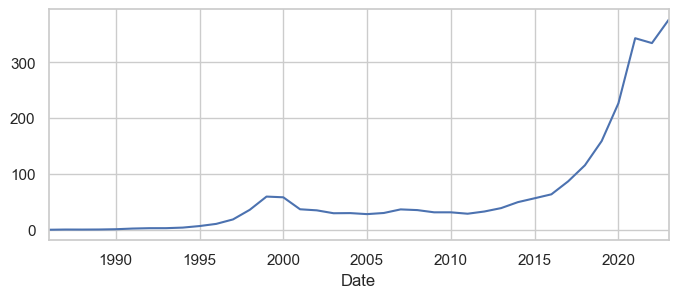

In [68]:
df1.resample(rule='A').max()['Close'].plot(figsize=(8,3))# year end frequency...data end of the year


* we can see that after 2010 there was sudden rise 



<Axes: xlabel='Date'>

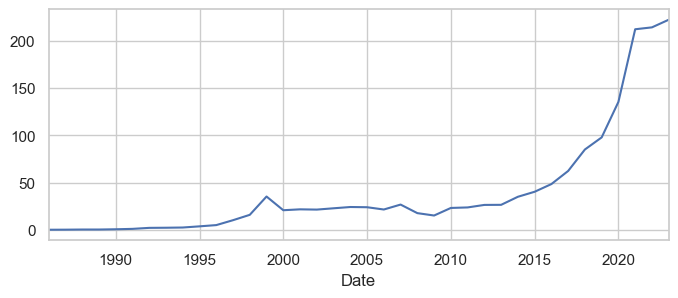

In [69]:
df1.resample(rule='A').min()['Close'].plot(figsize=(8,3))# year end frequency...data end of the year

<Axes: xlabel='Date'>

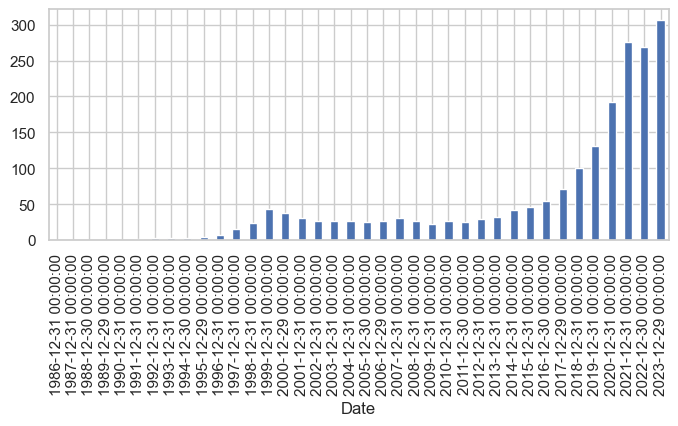

In [70]:
df1['Close'].resample(rule='BA').mean().plot(kind='bar',figsize=(8,3))


* hugh jumps can be seen 2018-12-31

# rolling and expanding

In [71]:
df1['Close'].rolling(10).mean()

Date
1986-03-13           NaN
1986-03-14           NaN
1986-03-17           NaN
1986-03-18           NaN
1986-03-19           NaN
                 ...    
2023-11-10    353.323001
2023-11-13    356.260001
2023-11-14    359.476001
2023-11-15    361.836002
2023-11-16    364.621002
Name: Close, Length: 9498, dtype: float64

In [72]:
df_30daysroll=pd.DataFrame()
df_30daysroll['Close:30 days rolling']=df1['Close'].rolling(30).mean()
df_30daysroll.iloc[27:33]

,Close:30 days rolling
Date,
1986-04-22,NaN
1986-04-23,NaN
1986-04-24,0.098249
1986-04-25,0.098915
1986-04-28,0.099465
1986-04-29,0.099870


<Axes: xlabel='Date'>

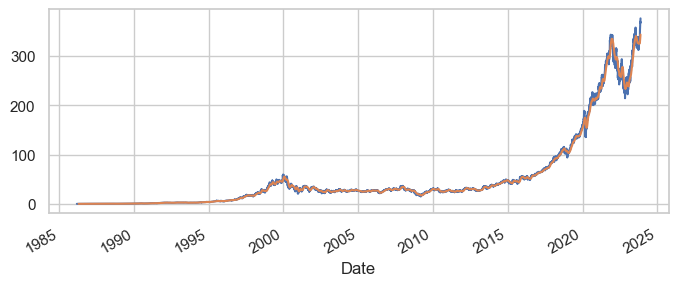

In [73]:
df1['Close'].plot(figsize=(8,3))
df_30daysroll['Close:30 days rolling'].plot(figsize=(8,3))

* little bit of smoothning has been done using rolling...

<Axes: xlabel='Date'>

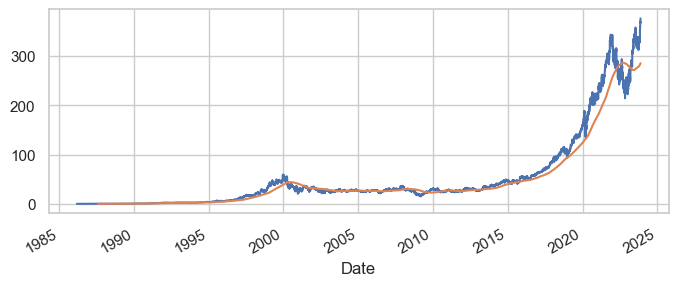

In [74]:
df_360daysrolling=pd.DataFrame()
df_360daysrolling['Close:360 days rolling']=df1['Close'].rolling(360).mean()
df1['Close'].plot(figsize=(8,3))
df_360daysrolling['Close:360 days rolling'].plot(figsize=(8,3))

* A lot has smoothen out

In [75]:
df1.head(1)

,Close
Date,
1986-03-13,0.097222


In [76]:
df1.head(1)

,Close
Date,
1986-03-13,0.097222


In [77]:
df1.shape

(9498, 1)

In [78]:
msft_new=copy.deepcopy(df1) 
msft_new.reset_index(inplace=True)

msft_new['Date']=pd.to_datetime(msft_new['Date'])

import datetime as dt

msft_new['month']=msft_new['Date'].dt.strftime("%b")
msft_new['year']=msft_new['Date'].dt.strftime("%Y")
msft_new.head(2)

,Date,Close,month,year
0,1986-03-13,0.097222,Mar,1986
1,1986-03-14,0.100694,Mar,1986


In [79]:
df1.head(1)

,Close
Date,
1986-03-13,0.097222


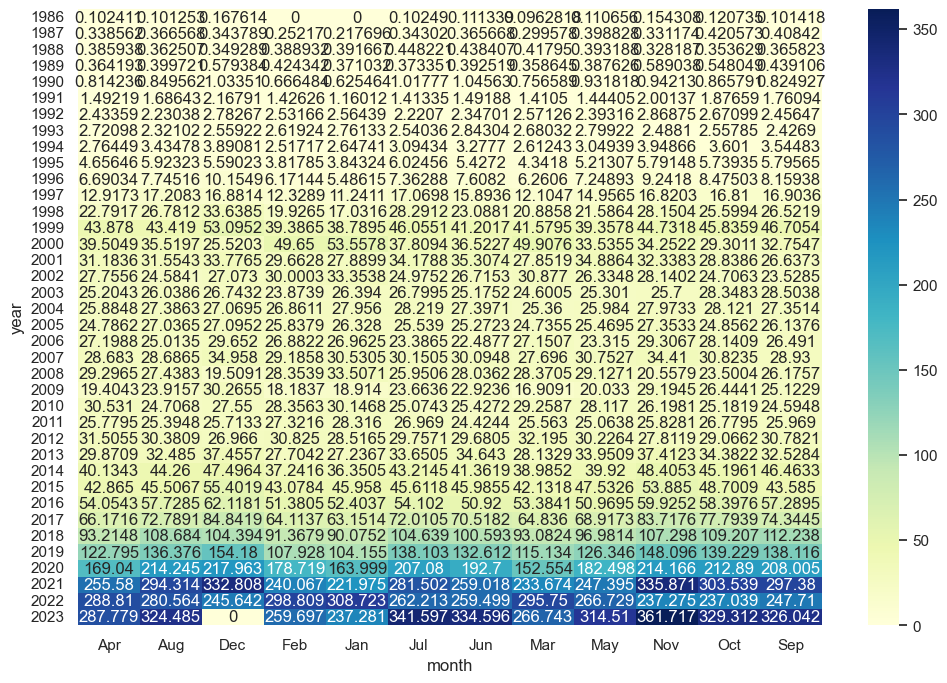

In [80]:
heatmap_y_month=pd.pivot_table(data=msft_new,
                        values='Close',
                        index='year',
                        columns='month',
                        aggfunc='mean',
                        fill_value=0)
#heatmap_y_month

plt.figure(figsize=(12,8))
sns.heatmap(heatmap_y_month,
            annot=True,
           fmt='g',
           cmap='YlGnBu')
plt.show()

In [81]:
#we can see that stock transaction happened most in the month of november 2023

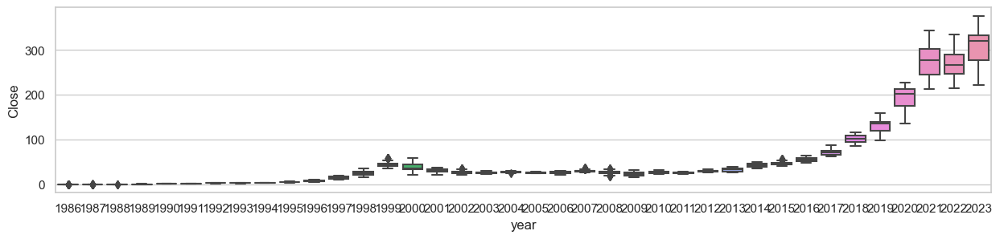

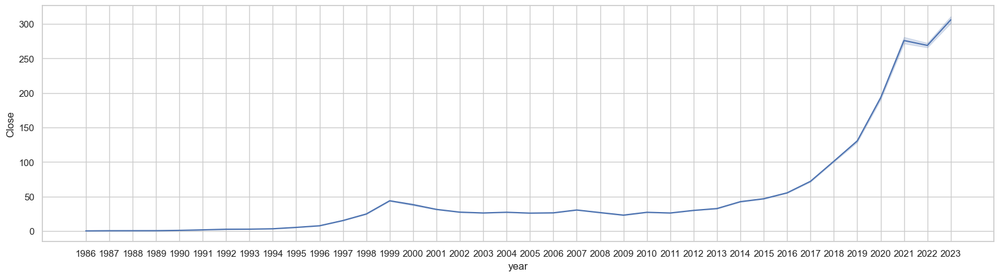

In [82]:






plt.figure(figsize=(15,3))
#plt.subplot(2,1,1)
#sns.boxplot(x='month',y='Close',data=msft)

#plt.subplot(212)
sns.boxplot(x='year',y='Close',data=msft_new)
plt.show()

plt.figure(figsize=(20,5))
sns.lineplot(x='year',y='Close',data=msft_new)
plt.show()



# linear Regression

In [83]:
#linear model
import statsmodels.formula.api as smf

#linear_model=smf.ols('Close~')

In [84]:
#splitting

In [85]:
0.8*9498

7598.400000000001

In [86]:
9498-(0.8*9498)

1899.5999999999995

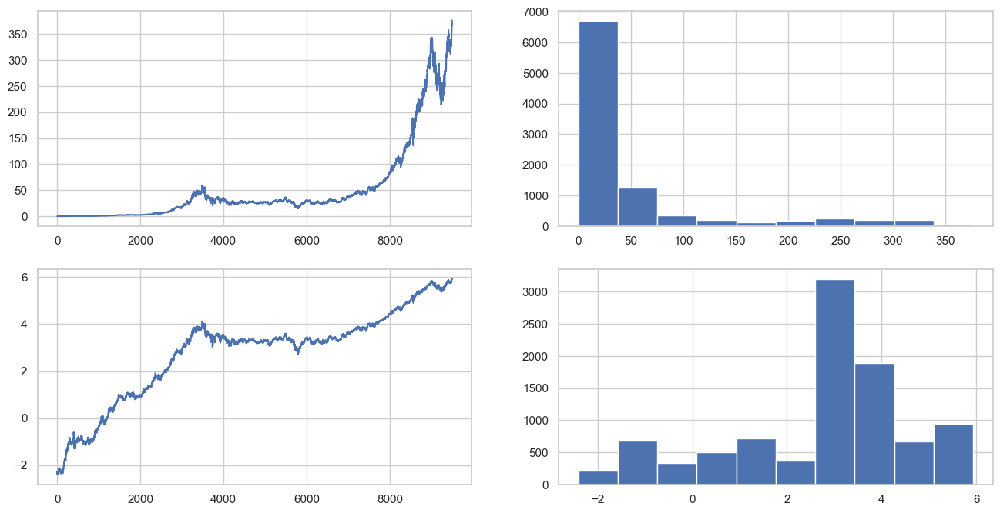

In [87]:
from numpy import log
msft_lr=copy.deepcopy(msft)
msft_lr['Log_Close'] = log(msft['Close'])
plt.figure(figsize=(16,8))
# line plot
plt.subplot(2,2,1)
plt.plot(msft['Close'])
# histogram
plt.subplot(2,2,2)
plt.hist(msft['Close'])
#plt.show()


# line plot
plt.subplot(2,2,3)
plt.plot(msft_lr['Log_Close'])
# histogram
plt.subplot(2,2,4)
plt.hist(msft_lr['Log_Close'])
plt.show()

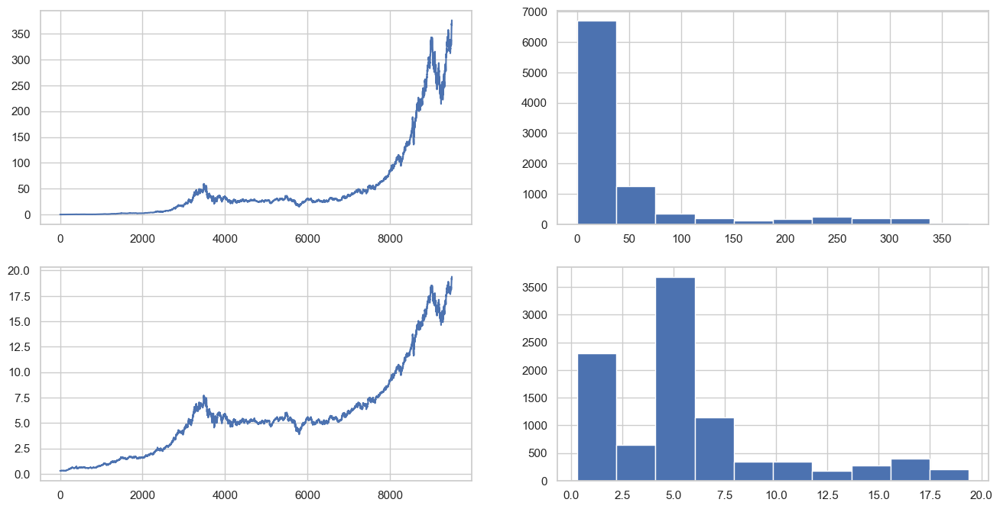

In [88]:
msft_lr['sqrt_Close'] = np.sqrt(msft['Close'])
plt.figure(figsize=(16,8))
# line plot
plt.subplot(2,2,1)
plt.plot(msft['Close'])
# histogram
plt.subplot(2,2,2)
plt.hist(msft['Close'])
#plt.show()


# line plot
plt.subplot(2,2,3)
plt.plot(msft_lr['sqrt_Close'])
# histogram
plt.subplot(2,2,4)
plt.hist(msft_lr['sqrt_Close'])
plt.show()

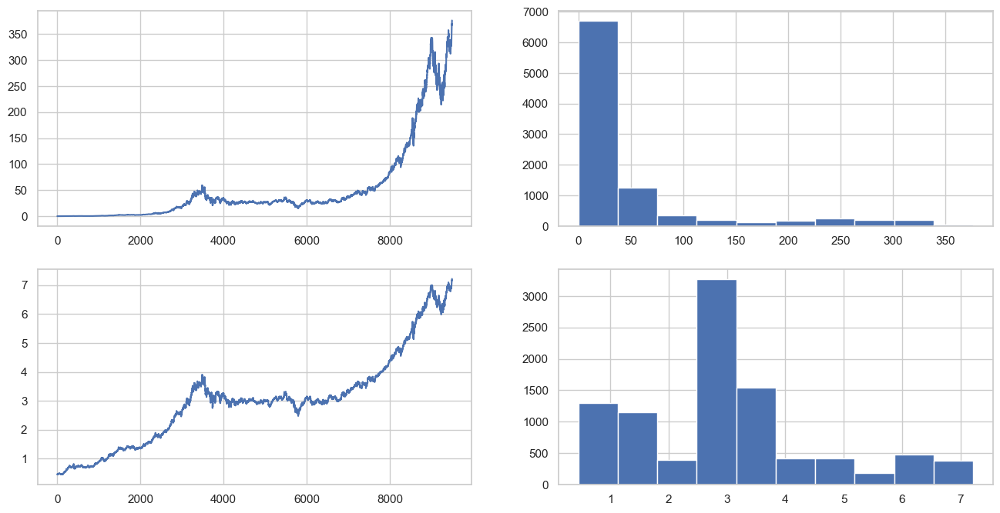

In [89]:
msft_lr['cbrt_Close'] = np.cbrt(msft['Close'])
plt.figure(figsize=(16,8))
# line plot
plt.subplot(2,2,1)
plt.plot(msft['Close'])
# histogram
plt.subplot(2,2,2)
plt.hist(msft['Close'])
#plt.show()


# line plot
plt.subplot(2,2,3)
plt.plot(msft_lr['cbrt_Close'])
# histogram
plt.subplot(2,2,4)
plt.hist(msft_lr['cbrt_Close'])
plt.show()

In [90]:

Train_lr=msft_lr.head(7598)
Test_lr=msft_lr.iloc[7599:]
Test_lr.shape


(1899, 10)

In [91]:
msft_lr

,Date,Open,High,Low,Close,AdjClose,Volume,Log_Close,sqrt_Close,cbrt_Close
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800,-2.330758,0.311804,0.459820
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062427,308160000,-2.295669,0.317323,0.465230
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063504,133171200,-2.278566,0.320048,0.467890
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061889,67766400,-2.304327,0.315953,0.463890
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.060812,47894400,-2.321870,0.313193,0.461185
...,...,...,...,...,...,...,...,...,...,...
9493,2023-11-10,361.489990,370.100006,361.070007,369.670013,368.921234,28042100,5.912611,19.226805,7.176919
9494,2023-11-13,368.220001,368.470001,365.899994,366.679993,365.937256,19986500,5.904490,19.148890,7.157517
9495,2023-11-14,371.010010,371.950012,367.350006,370.269989,369.519989,27683900,5.914232,19.242401,7.180800
9496,2023-11-15,371.279999,373.130005,367.109985,369.670013,369.670013,26860100,5.912611,19.226805,7.176919


# Linear Regression

In [92]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model_Open = smf.ols('Close~Open',data=Train_lr).fit()
pred_linear_Open =  pd.Series(linear_model_Open.predict(pd.DataFrame(Test_lr['Open'])))
rmse_linear_Open = np.sqrt(np.mean((np.array(Test_lr['Close'])-np.array(pred_linear_Open))**2))
rmse_linear_Open

2.8034751412781

In [93]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model_High = smf.ols('Close~High',data=Train_lr).fit()
pred_linear_High =  pd.Series(linear_model_High.predict(pd.DataFrame(Test_lr['High'])))
rmse_linear_High = np.sqrt(np.mean((np.array(Test_lr['Close'])-np.array(pred_linear_High))**2))
rmse_linear_High

2.019686745967728

In [94]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model_Low = smf.ols('Close~Low',data=Train_lr).fit()
pred_linear_Low =  pd.Series(linear_model_Low.predict(pd.DataFrame(Test_lr['Low'])))
rmse_linear_Low = np.sqrt(np.mean((np.array(Test_lr['Close'])-np.array(pred_linear_Low))**2))
rmse_linear_Low

1.9203319134444472

In [96]:
# report performance
rmse_linear = np.sqrt(mean_squared_error(Test_lr['Close'],pred_linear_Low))
print('RMSE: %.3f' % rmse_linear)

RMSE: 1.920


In [97]:
compare_rmse.append({'Linear':rmse_linear})

In [98]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model_Adj = smf.ols('Close~AdjClose',data=Train_lr).fit()
pred_linear_Adj =  pd.Series(linear_model_Adj.predict(pd.DataFrame(Test_lr['AdjClose'])))
rmse_linear_Adj= np.sqrt(np.mean((np.array(Test_lr['Close'])-np.array(pred_linear_Adj))**2))
rmse_linear_Adj

47.763492203558044

In [99]:
#Exponential

Exp = smf.ols('Log_Close~Low',data=Train_lr).fit()
pred_Exp = pd.Series(Exp.predict(pd.DataFrame(Test_lr['Low'])))
rmse_Exp = np.sqrt(np.mean((np.array(Test_lr['Log_Close'])-np.array(np.exp(pred_Exp)))**2))
rmse_Exp

476787036468274.94

In [100]:
# report performance
rmse_Exp = np.sqrt(mean_squared_error(Test_lr['Close'],pred_Exp))
print('RMSE: %.3f' % rmse_Exp)

compare_rmse.append({'Exponential':rmse_Exp})

RMSE: 181.589


In [101]:
#Additive seasonality 
import statsmodels.formula.api as smf 


add_sea = smf.ols('Close~Open+High+Low+AdjClose',data=Train_lr).fit()
pred_add_sea = pd.Series(add_sea.predict(Test_lr[['Open','High','Low','AdjClose']]))
rmse_add_sea = np.sqrt(np.mean((np.array(Test_lr['Close'])-np.array(pred_add_sea))**2))
rmse_add_sea

1.3024888683796312

In [102]:
# report performance
rmse_add_sea = np.sqrt(mean_squared_error(Test_lr['Close'],pred_add_sea))
print('RMSE: %.3f' % rmse_add_sea)

RMSE: 1.302


In [103]:
compare_rmse.append({'Additive Seasonality':rmse_add_sea})

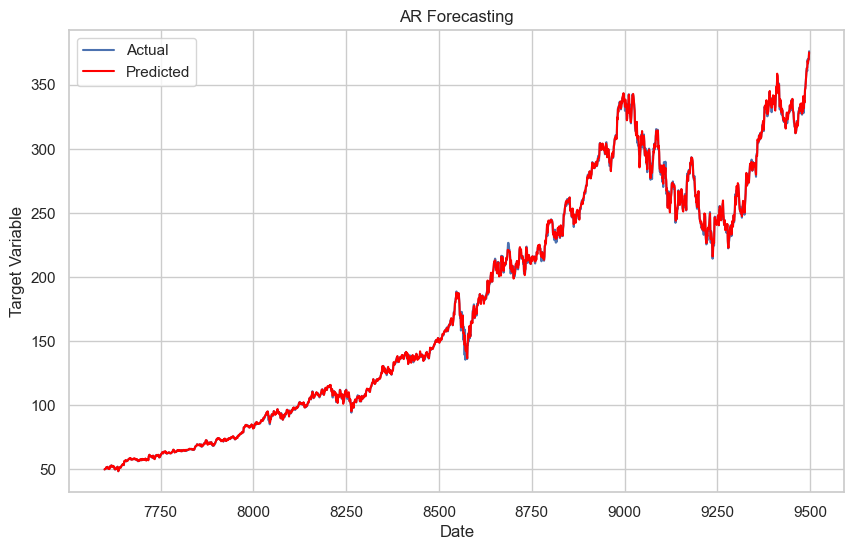

In [104]:
# Plotting the actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.plot(Test_lr.index,Test_lr['Close'], label='Actual')
plt.plot(Test_lr.index, pred_add_sea, color='red', label='Predicted')
plt.xlabel('Date')
plt.ylabel('Target Variable')
plt.title('AR Forecasting')
plt.legend()
plt.show()

In [105]:
#Compare the results 

data = {"MODEL":pd.Series(["rmse_add_sea","rmse_Exp",'rmse_linear_Adj',"rmse_linear_Low","rmse_linear_High","rmse_linear_Open"]),"RMSE_Values":pd.Series([rmse_add_sea,rmse_Exp,rmse_linear_Adj,rmse_linear_Low,rmse_linear_High,rmse_linear_Open])}
table_rmse=pd.DataFrame(data)
table_rmse.sort_values(['RMSE_Values'])

,MODEL,RMSE_Values
0,rmse_add_sea,1.302489
3,rmse_linear_Low,1.920332
4,rmse_linear_High,2.019687
5,rmse_linear_Open,2.803475
2,rmse_linear_Adj,47.763492
1,rmse_Exp,181.588774


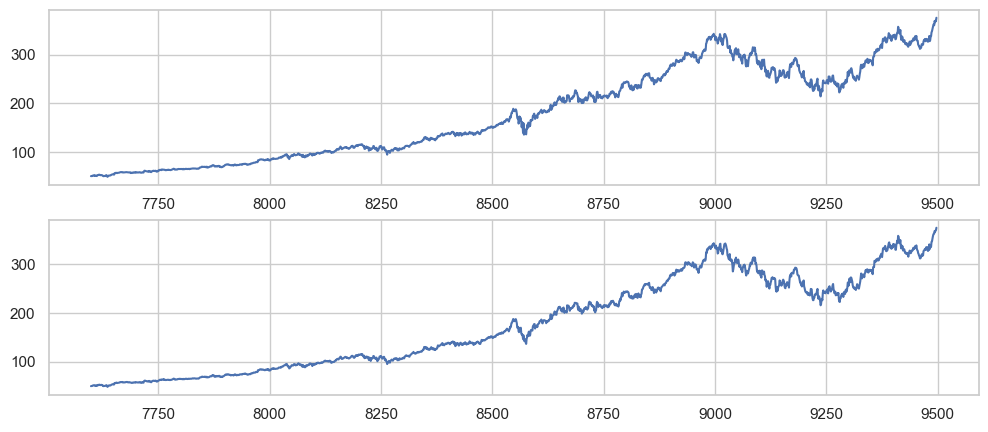

In [106]:

Test_lr['Predicted_Close']=pred_add_sea
plt.figure(figsize=(12,5))
plt.subplot(2,1,1)
plt.plot(Test_lr['Close'])
plt.subplot(2,1,2)
plt.plot(Test_lr['Predicted_Close'])

In [107]:
#Additive seasonality 
import statsmodels.formula.api as smf 


add_sea = smf.ols('Close~Open+High+Low+AdjClose',data=msft_lr).fit()
pred_add_sea = pd.Series(add_sea.predict(msft[['Open','High','Low','AdjClose']]))
rmse_add_sea = np.sqrt(np.mean((np.array(msft['Close'])-np.array(pred_add_sea))**2))
rmse_add_sea

0.5930092892556488

In [108]:
msft_lr['Predicted_Close']=pred_add_sea
msft_lr

,Date,Open,High,Low,Close,AdjClose,Volume,Log_Close,sqrt_Close,cbrt_Close,Predicted_Close
0,1986-03-13,0.088542,0.101563,0.088542,0.097222,0.060274,1031788800,-2.330758,0.311804,0.459820,0.204575
1,1986-03-14,0.097222,0.102431,0.097222,0.100694,0.062427,308160000,-2.295669,0.317323,0.465230,0.206871
2,1986-03-17,0.100694,0.103299,0.100694,0.102431,0.063504,133171200,-2.278566,0.320048,0.467890,0.208210
3,1986-03-18,0.102431,0.103299,0.098958,0.099826,0.061889,67766400,-2.304327,0.315953,0.463890,0.205673
4,1986-03-19,0.099826,0.100694,0.097222,0.098090,0.060812,47894400,-2.321870,0.313193,0.461185,0.203802
...,...,...,...,...,...,...,...,...,...,...,...
9493,2023-11-10,361.489990,370.100006,361.070007,369.670013,368.921234,28042100,5.912611,19.226805,7.176919,368.580065
9494,2023-11-13,368.220001,368.470001,365.899994,366.679993,365.937256,19986500,5.904490,19.148890,7.157517,366.878664
9495,2023-11-14,371.010010,371.950012,367.350006,370.269989,369.519989,27683900,5.914232,19.242401,7.180800,369.153900
9496,2023-11-15,371.279999,373.130005,367.109985,369.670013,369.670013,26860100,5.912611,19.226805,7.176919,369.736861


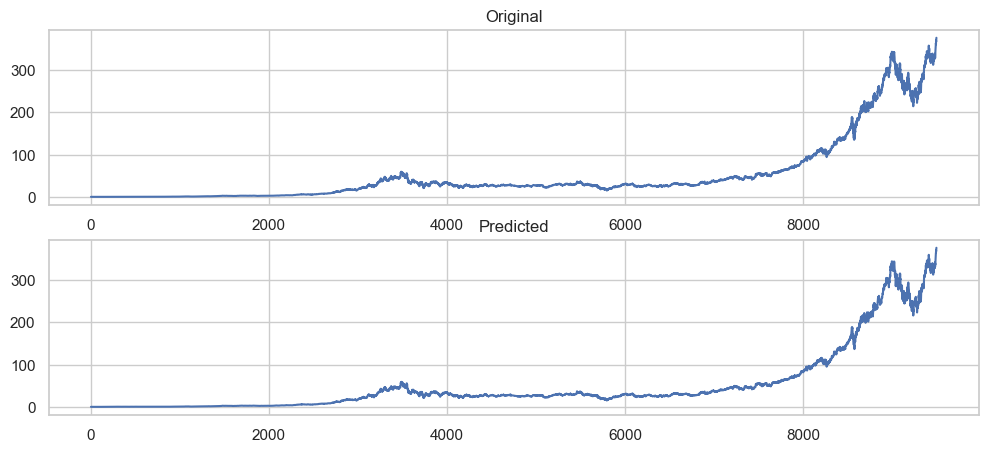

In [109]:

plt.figure(figsize=(12,5))
plt.subplot(2,1,1)
plt.title('Original')
plt.plot(msft_lr['Close'])
plt.subplot(2,1,2)
plt.title("Predicted")
plt.plot(msft_lr['Predicted_Close'])

# Arima

<Axes: xlabel='Date'>

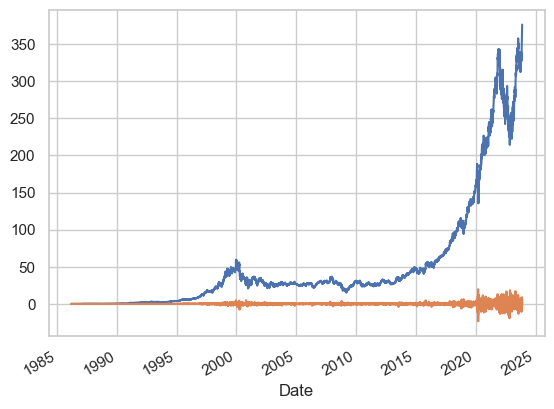

In [110]:
# Differencing Out
df1_arima=copy.deepcopy(df1)
df1_arima['First_Order']=df1_arima['Close'].diff(periods=1)
df1_arima['Close'].plot()
df1_arima['First_Order'].plot()

<Axes: xlabel='Date'>

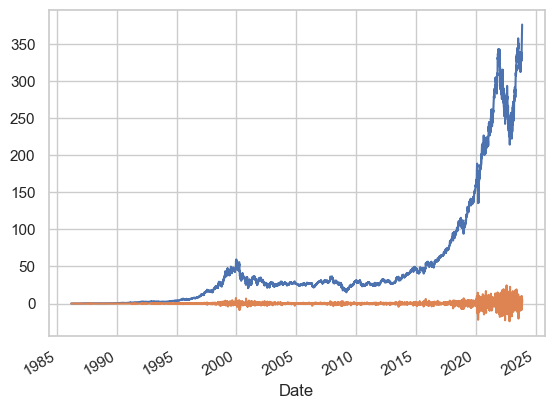

In [111]:
df1_arima['Second_Order']=df1_arima['Close'].diff(periods=2)
df1_arima['Close'].plot()
df1_arima['Second_Order'].plot()

<Axes: xlabel='Date'>

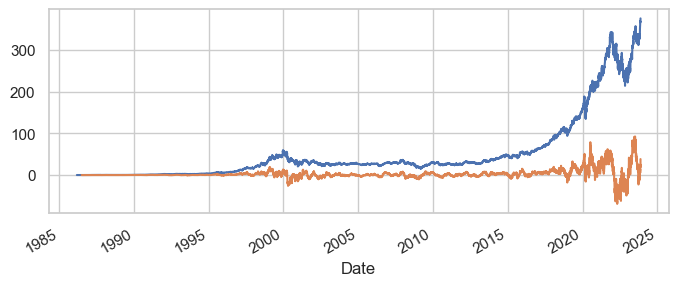

In [112]:
df1_arima['Second_Order']=df1_arima['Close'].diff(periods=80) #converting non stationary data to stationary
df1_arima['Close'].plot(figsize=(8,3))
df1_arima['Second_Order'].plot(figsize=(8,3))

In [113]:
df1_arima.drop(columns=['First_Order','Second_Order'],inplace=True)

In [114]:
df1_arima['Close'] = df1_arima['Close'].astype('float32')
df1_arima.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9498 entries, 1986-03-13 to 2023-11-16
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   9498 non-null   float32
dtypes: float32(1)
memory usage: 369.3 KB


In [115]:
# separate out a validation dataset
split_point = len(df1) - int(len(df1)*0.2)# 80% of data
train_arima,test_arima = df1[0:split_point], df1[split_point:]
print('train: %d, test: %d' % (len(train_arima), len(test_arima)))


train: 7599, test: 1899


In [116]:
stepwise_fit=auto_arima(train_arima,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=11408.961, Time=8.13 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=11407.742, Time=1.68 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=11405.081, Time=2.24 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=11405.054, Time=1.24 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=11406.979, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=11404.969, Time=5.59 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=11409.015, Time=3.35 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=11409.053, Time=3.85 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=11406.970, Time=2.79 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=11407.028, Time=3.61 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=11404.362, Time=2.27 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=11404.356, Time=0.48 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=11406.282, Time=0.67 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=11404.382, Time=1.07 sec
 ARIMA(1,1,2)(0,0,0

In [117]:
stepwise_fit=auto_arima(df1_arima['Close'],trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=inf, Time=9.32 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=43838.803, Time=0.34 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=40706.628, Time=0.50 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=1.80 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=39417.999, Time=0.69 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=38623.179, Time=0.92 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=38044.615, Time=1.29 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=37920.621, Time=1.67 sec
 ARIMA(5,2,1)(0,0,0)[0]             : AIC=inf, Time=9.07 sec
 ARIMA(4,2,1)(0,0,0)[0]             : AIC=inf, Time=5.72 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=37922.618, Time=3.54 sec

Best model:  ARIMA(5,2,0)(0,0,0)[0]          
Total fit time: 34.906 seconds


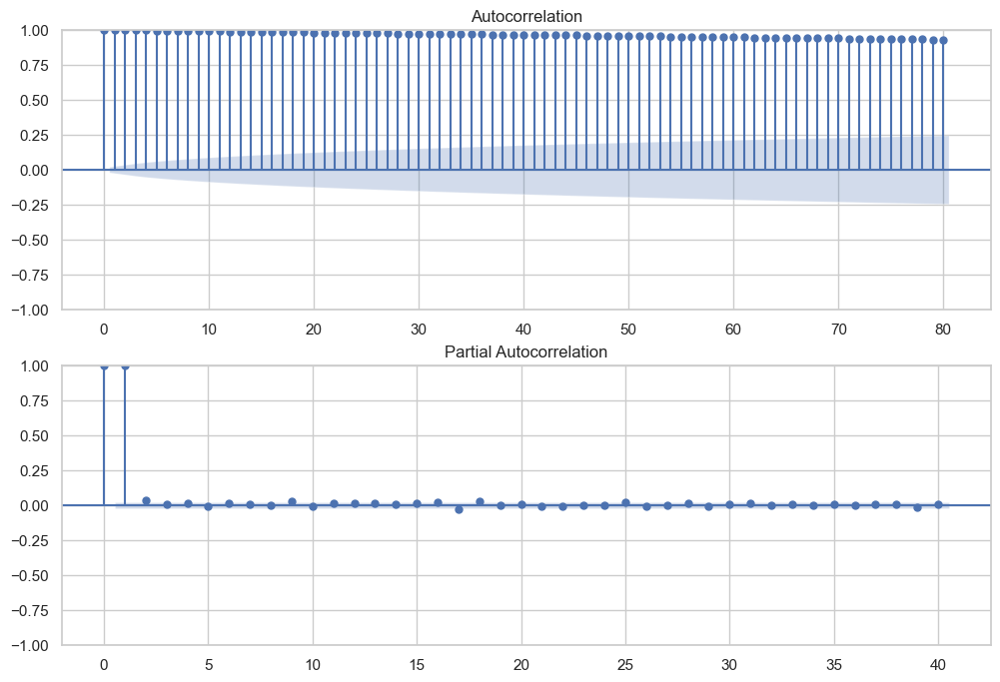

In [118]:
seasonal=df1_arima['Close']
fig=plt.figure(figsize=(12,8))
ax1=fig.add_subplot(211)
fig=sm.graphics.tsa.plot_acf(seasonal,lags=80,ax=ax1)

ax2=fig.add_subplot(212)
fig=sm.graphics.tsa.plot_pacf(seasonal,lags=40,ax=ax2)

In [119]:
# fit model
model_arima_1 = ARIMA(train_arima, order=(0,1,1)).fit()
#model_fit = model.fit()
ypred_arima_1=model_arima_1.predict(start=7599,end=9497)#[0]
ypred_arima_1

7599    49.80007
7600    49.80007
7601    49.80007
7602    49.80007
7603    49.80007
          ...   
9493    49.80007
9494    49.80007
9495    49.80007
9496    49.80007
9497    49.80007
Name: predicted_mean, Length: 1899, dtype: float64

In [120]:
# report performance
rmse_arima_1 = np.sqrt(mean_squared_error(test_arima, ypred_arima_1))
print('RMSE: %.3f' % rmse_arima_1)

RMSE: 159.137


In [121]:
# fit model
model_arima_2 = ARIMA(train_arima.values, order=(1,1,2)).fit()

ypred_arima_2=model_arima_2.predict(start=7599,end=9497)#[0]


# report performance
rmse_arima_2 = np.sqrt(mean_squared_error(test_arima, ypred_arima_2))
print('RMSE: %.3f' % rmse_arima_2)

RMSE: 159.137


In [122]:
# fit model
model_arima_3 = ARIMA(df1_arima['Close'].values, order=(5,2,0)).fit()

ypred_arima_3=model_arima_3.predict(start=7599,end=9497)#[0]


# report performance
rmse_arima_3 = np.sqrt(mean_squared_error(test_arima, ypred_arima_3))
print('RMSE: %.3f' % rmse_arima_3)

RMSE: 3.823


In [123]:
# fit model
model_arima_4 = ARIMA(df1_arima['Close'].values, order=(1,1,2)).fit()

ypred_arima_4=model_arima_4.predict(start=7599,end=9497)#[0]
#ypred


# report performance
rmse_arima_4 = np.sqrt(mean_squared_error(test_arima, ypred_arima_4))
print('RMSE: %.3f' % rmse_arima_4)

RMSE: 3.520


In [124]:
compare_rmse=[{'Arima':rmse_arima_4}]
compare_rmse

[{'Arima': 3.5199589710208112}]

In [125]:
ypred_arima=model_arima_4.predict(start=9498,end=10227)

fd_arima=pd.DataFrame(pd.date_range(start='2023-11-17',end='2025-11-16',freq='B'),columns=['Date'])
fd_arima.set_index('Date',inplace=True)

futuredate_arima=pd.DataFrame({'Close':ypred_arima})

futuredate_arima



,Close
0,375.541208
1,375.368985
2,375.343944
3,375.340302
4,375.339773
...,...
725,375.339683
726,375.339683
727,375.339683
728,375.339683


In [126]:
futuredate_arima['Date']=pd.date_range(start='2023-11-17',end='2025-11-15')
futuredate_arima

,Close,Date
0,375.541208,2023-11-17
1,375.368985,2023-11-18
2,375.343944,2023-11-19
3,375.340302,2023-11-20
4,375.339773,2023-11-21
...,...,...
725,375.339683,2025-11-11
726,375.339683,2025-11-12
727,375.339683,2025-11-13
728,375.339683,2025-11-14


In [127]:
futuredate_arima.set_index('Date',inplace=True)

In [128]:
future_data_Arima=pd.concat([df1,futuredate_arima])
future_data_Arima

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2025-11-11,375.339683
2025-11-12,375.339683
2025-11-13,375.339683


<Axes: xlabel='Date'>

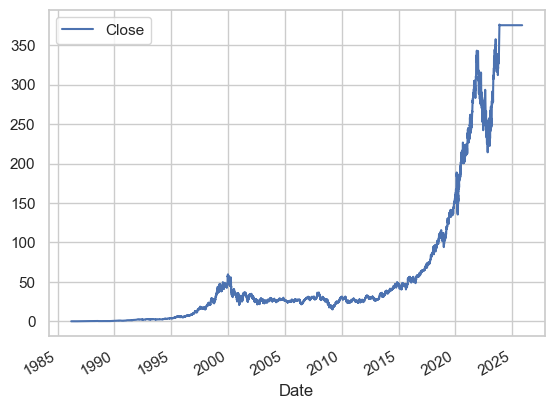

In [129]:
future_data_Arima.plot()

# FBProphet

In [130]:
from sklearn.metrics import mean_absolute_error
from prophet import Prophet

In [131]:
df_prophet=copy.deepcopy(df1)
df_prophet_360daysrolling=copy.deepcopy(df_360daysrolling)

df_prophet.reset_index(inplace=True)
df_prophet_360daysrolling.reset_index(inplace=True)
df_prophet

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


In [132]:
df_prophet.columns=['ds','y']
df_prophet_360daysrolling.columns=['ds','y']
df_prophet

,ds,y
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


In [133]:
Train_prophet=df_prophet.head(7598)
Test_prophet=df_prophet.iloc[7599:]
Train_360daysrolling=df_prophet_360daysrolling.head(7598)
Test_360daysrolling=df_prophet_360daysrolling.iloc[7599:]

In [134]:
model_prophet=Prophet()

In [135]:
model_prophet_360daysrolling=Prophet()

In [136]:
model_prophet.fit(Train_prophet)

18:54:08 - cmdstanpy - INFO - Chain [1] start processing
18:54:16 - cmdstanpy - INFO - Chain [1] done processing


In [137]:
model_prophet_360daysrolling.fit(Train_360daysrolling)

18:54:17 - cmdstanpy - INFO - Chain [1] start processing
18:54:31 - cmdstanpy - INFO - Chain [1] done processing


In [138]:
prediction_prophet=model_prophet.predict(Test_prophet)

In [139]:
prediction_prophet_360daysrolling=model_prophet_360daysrolling.predict(Test_360daysrolling)

In [140]:
prediction_prophet

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-05-04,49.293467,45.612779,52.639925,49.293467,49.293467,-0.038731,-0.038731,-0.038731,-0.007233,-0.007233,-0.007233,-0.031498,-0.031498,-0.031498,0.0,0.0,0.0,49.254736
1,2016-05-05,49.305655,45.563059,52.542825,49.305655,49.305655,-0.042989,-0.042989,-0.042989,0.011229,0.011229,0.011229,-0.054218,-0.054218,-0.054218,0.0,0.0,0.0,49.262666
2,2016-05-06,49.317844,45.627314,52.768109,49.317844,49.317844,-0.113485,-0.113485,-0.113485,-0.033854,-0.033854,-0.033854,-0.079631,-0.079631,-0.079631,0.0,0.0,0.0,49.204359
3,2016-05-09,49.354409,45.700668,52.516027,49.354409,49.354409,-0.169371,-0.169371,-0.169371,0.000006,0.000006,0.000006,-0.169377,-0.169377,-0.169377,0.0,0.0,0.0,49.185037
4,2016-05-10,49.366597,45.938469,52.797790,49.366597,49.366597,-0.225273,-0.225273,-0.225273,-0.022623,-0.022623,-0.022623,-0.202650,-0.202650,-0.202650,0.0,0.0,0.0,49.141324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1894,2023-11-10,82.762578,24.534342,141.682247,24.673832,141.262353,0.515791,0.515791,0.515791,-0.033854,-0.033854,-0.033854,0.549645,0.549645,0.549645,0.0,0.0,0.0,83.278369
1895,2023-11-13,82.799143,24.492938,142.533870,24.702614,141.328535,0.513901,0.513901,0.513901,0.000006,0.000006,0.000006,0.513895,0.513895,0.513895,0.0,0.0,0.0,83.313044
1896,2023-11-14,82.811331,25.523887,141.868726,24.707020,141.366199,0.473399,0.473399,0.473399,-0.022623,-0.022623,-0.022623,0.496022,0.496022,0.496022,0.0,0.0,0.0,83.284730
1897,2023-11-15,82.823519,24.126087,142.849384,24.711426,141.431976,0.469021,0.469021,0.469021,-0.007233,-0.007233,-0.007233,0.476254,0.476254,0.476254,0.0,0.0,0.0,83.292540


In [141]:
# report performance
rmse_prophet = np.sqrt(mean_squared_error(Test_prophet['y'],prediction_prophet['yhat']))
print('RMSE: %.3f' % rmse_prophet)

RMSE: 140.593


In [142]:
compare_rmse.append({'fbprophet':rmse_prophet})
compare_rmse

[{'Arima': 3.5199589710208112}, {'fbprophet': 140.59321778108063}]

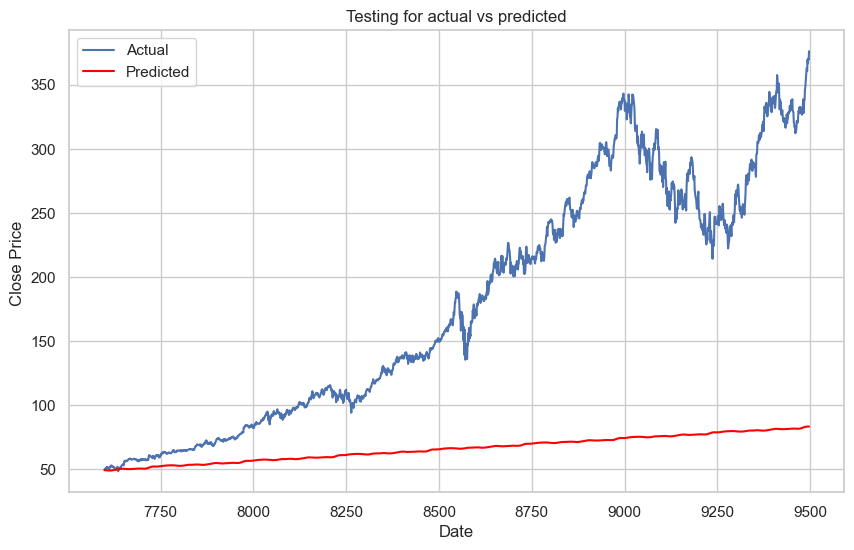

In [143]:
# Plotting the actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.plot(Test_prophet.index, Test_prophet['y'], label='Actual')
plt.plot(Test_prophet.index, prediction_prophet['yhat'], color='red', label='Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price ')
plt.title('Testing for actual vs predicted')
plt.legend()
plt.show()

In [144]:
# report performance
rmse_prophet_360daysrolling = np.sqrt(mean_squared_error(Test_360daysrolling['y'],prediction_prophet_360daysrolling['yhat']))
print('RMSE: %.3f' % rmse_prophet_360daysrolling)

RMSE: 124.035


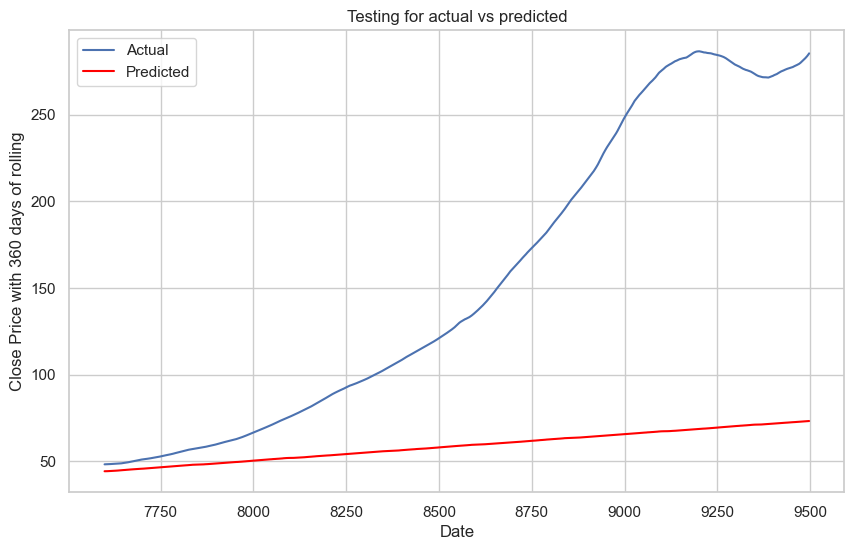

In [145]:
# Plotting the actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.plot(Test_360daysrolling.index, Test_360daysrolling['y'], label='Actual')
plt.plot(Test_360daysrolling.index, prediction_prophet_360daysrolling['yhat'], color='red', label='Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price with 360 days of rolling')
plt.title('Testing for actual vs predicted')
plt.legend()
plt.show()

In [146]:
model_prophet_full=Prophet()
model_prophet_full.fit(df_prophet)

18:54:37 - cmdstanpy - INFO - Chain [1] start processing
18:54:46 - cmdstanpy - INFO - Chain [1] done processing


In [147]:
#to check if it has run correctly
model_prophet.component_modes

{'additive': ['yearly',
  'weekly',
  'additive_terms',
  'extra_regressors_additive',
  'holidays'],
 'multiplicative': ['multiplicative_terms', 'extra_regressors_multiplicative']}

In [148]:
#create future dates of 730 days
future_dates=model_prophet_full.make_future_dataframe(periods=730)#will create next 730 days and append 
future_dates

,ds
0,1986-03-13
1,1986-03-14
2,1986-03-17
3,1986-03-18
4,1986-03-19
...,...
10223,2025-11-11
10224,2025-11-12
10225,2025-11-13
10226,2025-11-14


In [149]:
model_prophet_full.make_future_dataframe(periods=730)

,ds
0,1986-03-13
1,1986-03-14
2,1986-03-17
3,1986-03-18
4,1986-03-19
...,...
10223,2025-11-11
10224,2025-11-12
10225,2025-11-13
10226,2025-11-14


In [150]:
prediction_prophet=model_prophet_full.predict(future_dates)

In [151]:
365*2

730

In [152]:
prediction_prophet.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1986-03-13,-0.246624,-18.520590,13.547450,-0.246624,-0.246624,-1.811176,-1.811176,-1.811176,-0.024169,-0.024169,-0.024169,-1.787007,-1.787007,-1.787007,0.0,0.0,0.0,-2.057800
1,1986-03-14,-0.245743,-18.817632,13.787303,-0.245743,-0.245743,-1.861024,-1.861024,-1.861024,-0.139431,-0.139431,-0.139431,-1.721593,-1.721593,-1.721593,0.0,0.0,0.0,-2.106767
2,1986-03-17,-0.243100,-18.173307,14.142552,-0.243100,-0.243100,-1.540302,-1.540302,-1.540302,-0.052344,-0.052344,-0.052344,-1.487958,-1.487958,-1.487958,0.0,0.0,0.0,-1.783402
3,1986-03-18,-0.242219,-18.928729,14.191949,-0.242219,-0.242219,-1.500951,-1.500951,-1.500951,-0.099034,-0.099034,-0.099034,-1.401917,-1.401917,-1.401917,0.0,0.0,0.0,-1.743170
4,1986-03-19,-0.241338,-18.332815,15.059549,-0.241338,-0.241338,-1.345716,-1.345716,-1.345716,-0.031809,-0.031809,-0.031809,-1.313907,-1.313907,-1.313907,0.0,0.0,0.0,-1.587054


In [153]:
#yhat is the output feature
#yhat_upper and yhat_lower are the limit in which the predicted values will be lying 

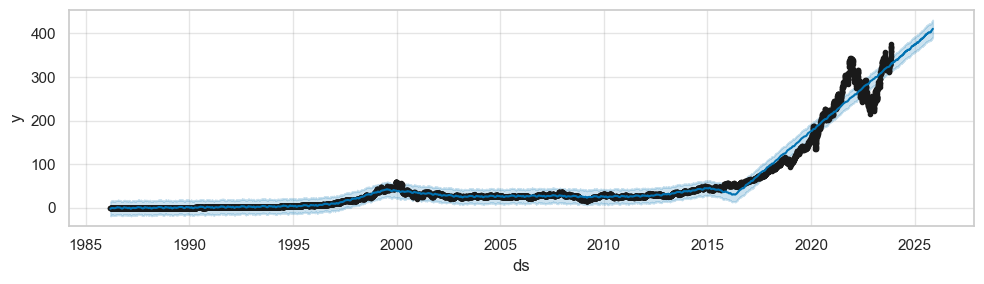

In [154]:
model_prophet_full.plot(prediction_prophet,figsize=(10,3))
plt.show()

In [155]:
#black dots are real data 
#blue line is the projection
#blue space is trend space

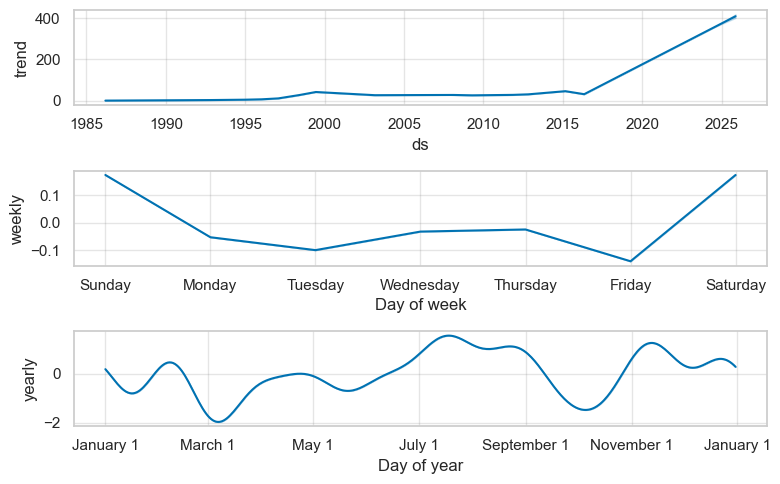

In [156]:
#visualize each components[Trends,yearly]
model_prophet_full.plot_components(prediction_prophet,figsize=(8,5))
plt.show()

# cross validation

Time Series Analysis

1986-1988

cross validation

1986-1987---Train
1987-1988---Test
1988-1989---validtion

In [157]:
from prophet.diagnostics import cross_validation

In [158]:
df_cv=cross_validation(model_prophet_full,initial='730 days',period='180 days',horizon='365 days')
df_cv

  0%|          | 0/71 [00:00<?, ?it/s]

18:54:57 - cmdstanpy - INFO - Chain [1] start processing
18:54:58 - cmdstanpy - INFO - Chain [1] done processing
18:54:58 - cmdstanpy - INFO - Chain [1] start processing
18:54:59 - cmdstanpy - INFO - Chain [1] done processing
18:54:59 - cmdstanpy - INFO - Chain [1] start processing
18:55:00 - cmdstanpy - INFO - Chain [1] done processing
18:55:00 - cmdstanpy - INFO - Chain [1] start processing
18:55:01 - cmdstanpy - INFO - Chain [1] done processing
18:55:01 - cmdstanpy - INFO - Chain [1] start processing
18:55:02 - cmdstanpy - INFO - Chain [1] done processing
18:55:02 - cmdstanpy - INFO - Chain [1] start processing
18:55:03 - cmdstanpy - INFO - Chain [1] done processing
18:55:03 - cmdstanpy - INFO - Chain [1] start processing
18:55:04 - cmdstanpy - INFO - Chain [1] done processing
18:55:04 - cmdstanpy - INFO - Chain [1] start processing
18:55:06 - cmdstanpy - INFO - Chain [1] done processing
18:55:06 - cmdstanpy - INFO - Chain [1] start processing
18:55:08 - cmdstanpy - INFO - Chain [1]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1988-05-19,0.402045,0.372070,0.429433,0.395833,1988-05-18
1,1988-05-20,0.398756,0.370598,0.427438,0.390625,1988-05-18
2,1988-05-23,0.391077,0.361918,0.420014,0.381944,1988-05-18
3,1988-05-24,0.389815,0.359946,0.420351,0.394097,1988-05-18
4,1988-05-25,0.388786,0.360538,0.418188,0.387153,1988-05-18
...,...,...,...,...,...,...
17871,2023-11-10,324.178626,305.325686,341.230459,369.670013,2022-11-16
17872,2023-11-13,324.815553,306.302041,342.248609,366.679993,2022-11-16
17873,2023-11-14,324.987486,307.870669,343.230195,370.269989,2022-11-16
17874,2023-11-15,325.216723,306.835140,342.260388,369.670013,2022-11-16


In [159]:
from prophet.diagnostics import performance_metrics
df_p=performance_metrics(df_cv) #taking yhat and y from df_cv to check the performance metrics
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,355.707795,18.860217,8.521710,0.133571,0.095332,0.133634,0.395273
1,38 days,358.093207,18.923351,8.524480,0.133387,0.095680,0.133636,0.394436
2,39 days,358.757566,18.940897,8.524260,0.133371,0.096116,0.133790,0.393016
3,40 days,362.367834,19.035962,8.569607,0.134312,0.097590,0.134763,0.391961
4,41 days,363.002690,19.052629,8.603530,0.135419,0.097940,0.135804,0.391998


In [160]:
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,355.707795,18.860217,8.521710,0.133571,0.095332,0.133634,0.395273
1,38 days,358.093207,18.923351,8.524480,0.133387,0.095680,0.133636,0.394436
2,39 days,358.757566,18.940897,8.524260,0.133371,0.096116,0.133790,0.393016
3,40 days,362.367834,19.035962,8.569607,0.134312,0.097590,0.134763,0.391961
4,41 days,363.002690,19.052629,8.603530,0.135419,0.097940,0.135804,0.391998
...,...,...,...,...,...,...,...,...
324,361 days,785.215937,28.021705,14.568214,0.271175,0.249235,0.284440,0.230367
325,362 days,791.380648,28.131489,14.616288,0.271444,0.248076,0.284460,0.232419
326,363 days,796.905683,28.229518,14.658995,0.271492,0.247485,0.284190,0.234382
327,364 days,788.500604,28.080253,14.584184,0.270397,0.242386,0.282951,0.236915


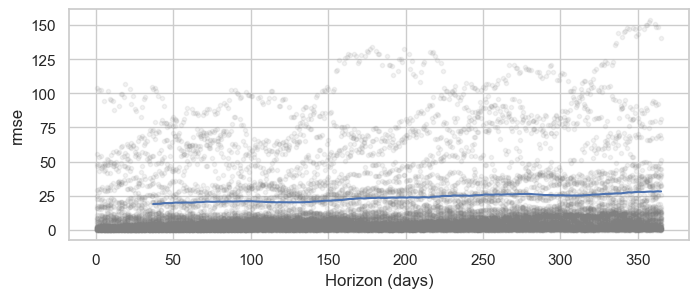

In [161]:
from prophet.plot import plot_cross_validation_metric
plot_cross_validation_metric(df_cv,metric='rmse',figsize=(8,3))
plt.show()

# autoregressive model

In [162]:
import pandas as pd
from statsmodels.tsa.ar_model import AutoReg
import matplotlib.pyplot as plt

# Assuming 'date_column' is the datetime index and 'target_column' is the column you want to forecast
# df.set_index('date_column', inplace=True)

# Splitting the data into training and testing sets
train_length = int(len(df1) * 0.8)
train_data = df1.iloc[:train_length]
test_data = df1.iloc[train_length:]



In [163]:
# Fit an autoregressive model
lag = 1  # You can adjust the lag order based on the data
model = AutoReg(train_data['Close'], lags=lag)
model_fit = model.fit()

# Make predictions
predictions = model_fit.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1, dynamic=False)




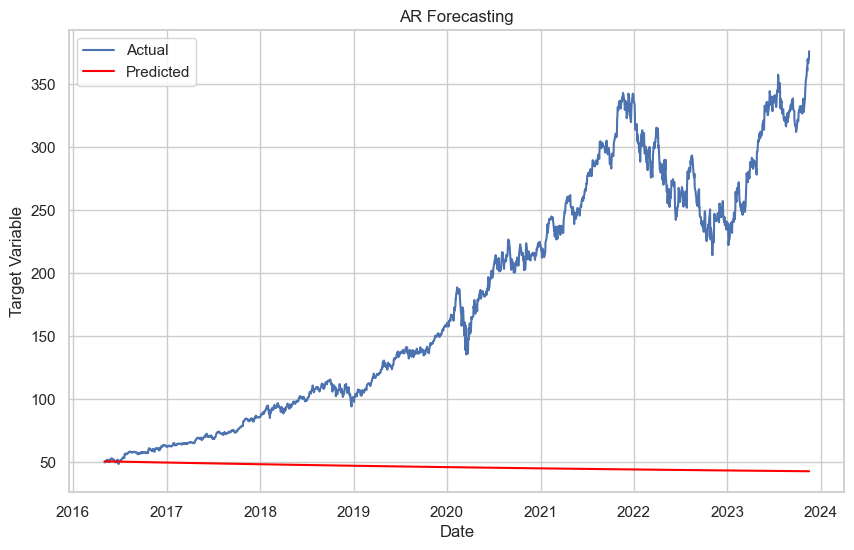

In [164]:
# Plotting the actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.plot(test_data.index, test_data['Close'], label='Actual')
plt.plot(test_data.index, predictions, color='red', label='Predicted')
plt.xlabel('Date')
plt.ylabel('Target Variable')
plt.title('AR Forecasting')
plt.legend()
plt.show()

In [165]:
# report performance
rmse_linear = np.sqrt(mean_squared_error(test_data, predictions))
print('RMSE: %.3f' % rmse_linear)

RMSE: 163.320


In [166]:
compare_rmse.append({'autoregressive model':rmse_linear})
compare_rmse

[{'Arima': 3.5199589710208112},
 {'fbprophet': 140.59321778108063},
 {'autoregressive model': 163.3197636118318}]

# data driven:

In [167]:
df1_data_driven=df1.reset_index()
df1_data_driven

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


# Evaluation Metric MAPE

In [168]:
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

In [169]:
train_data_driven=df1_data_driven.iloc[:int(len(df1_data_driven)*0.8)]
test_data_driven=df1_data_driven.iloc[int(len(df1_data_driven)*0.8):]
train_data_driven,test_data_driven

(           Date      Close
 0    1986-03-13   0.097222
 1    1986-03-14   0.100694
 2    1986-03-17   0.102431
 3    1986-03-18   0.099826
 4    1986-03-19   0.098090
 ...         ...        ...
 7593 2016-04-26  51.439999
 7594 2016-04-27  50.939999
 7595 2016-04-28  49.900002
 7596 2016-04-29  49.869999
 7597 2016-05-02  50.610001
 
 [7598 rows x 2 columns],
            Date       Close
 7598 2016-05-03   49.779999
 7599 2016-05-04   49.869999
 7600 2016-05-05   49.939999
 7601 2016-05-06   50.389999
 7602 2016-05-09   50.070000
 ...         ...         ...
 9493 2023-11-10  369.670013
 9494 2023-11-13  366.679993
 9495 2023-11-14  370.269989
 9496 2023-11-15  369.670013
 9497 2023-11-16  376.170013
 
 [1900 rows x 2 columns])

# Simple Exponential Method

In [170]:
ses_model = SimpleExpSmoothing(train_data_driven["Close"]).fit()#smoothing_level=0.2)
pred_ses = ses_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_ses,test_data_driven['Close'])

60.291353518939076

In [171]:
ses_model = SimpleExpSmoothing(train_data_driven["Close"]).fit(smoothing_level=0.2)
pred_ses = ses_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_ses,test_data_driven['Close'])

59.47474141294188

In [172]:
ses_model = SimpleExpSmoothing(train_data_driven["Close"]).fit(smoothing_level=0.1)
pred_ses = ses_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_ses,test_data_driven['Close'])

58.66771950388951

In [173]:
# report performance
rmse_sesmodel  = np.sqrt(mean_squared_error(test_data_driven['Close'],pred_ses))
print('RMSE: %.3f' % rmse_sesmodel)

RMSE: 156.627


In [174]:
compare_rmse.append({'Simple Exponential':rmse_sesmodel})

In [175]:
ses_model = SimpleExpSmoothing(train_data_driven["Close"]).fit(smoothing_level=0.3)
pred_ses = ses_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_ses,test_data_driven['Close'])

59.99884519346221

# Holt method

In [176]:
hw_model = Holt(train_data_driven["Close"]).fit()#smoothing_level=0.8, smoothing_slope=0.2)
pred_hw = hw_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hw,test_data_driven.Close) 

58.5536573088897

In [178]:
# report performance
rmse_model  = np.sqrt(mean_squared_error(test_data_driven['Close'],pred_hw))
print('RMSE: %.3f' % rmse_model)

RMSE: 154.717


In [180]:
compare_rmse.append({'Holt':rmse_model})

In [181]:
hw_model = Holt(train_data_driven["Close"]).fit(smoothing_level=0.8, smoothing_slope=0.2)
pred_hw = hw_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hw,test_data_driven.Close) 

231.11591715917248

In [182]:
hw_model = Holt(train_data_driven["Close"]).fit(smoothing_level=0.8, smoothing_slope=0.1)
pred_hw = hw_model.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hw,test_data_driven.Close) 

201.1888406540697

# Holts winter exponential smoothing with additive seasonality and additive trend

In [183]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=12).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close)

56.99201477802862

In [184]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=2).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close)

56.959857134835914

In [185]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=5).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close)

56.97606471618807

In [186]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=30).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close)

56.98317663484751

In [187]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=252).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close)

57.021774730405895

In [188]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=360).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close)

56.90651029460201

In [189]:
hwe_model_add_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="add",trend="add",seasonal_periods=730).fit() ##add the trend to the model
pred_hwe_add_add = hwe_model_add_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_add_add,test_data_driven.Close) 

56.50732237574767

In [190]:
# report performance
rmse_model_add_add  = np.sqrt(mean_squared_error(test_data_driven['Close'],pred_hwe_add_add))
print('RMSE: %.3f' % rmse_model_add_add)

RMSE: 150.683


In [191]:
compare_rmse.append({'Exponential with Additive Seasonality and Additive Trend':rmse_model_add_add})

# Holts winter exponential smoothing with multiplicative seasonality and additive trend

In [192]:
hwe_model_mul_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="mul",trend="add",seasonal_periods=730).fit() 
pred_hwe_mul_add = hwe_model_mul_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_mul_add,test_data_driven.Close)

52.2828952404691

In [193]:
# report performance
rmse_model_mul_add_1  = np.sqrt(mean_squared_error(test_data_driven['Close'],pred_hwe_mul_add))
print('RMSE: %.3f' % rmse_model_mul_add_1)

RMSE: 143.569


In [194]:
hwe_model_mul_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="mul",trend="add",seasonal_periods=12).fit() 
pred_hwe_mul_add = hwe_model_mul_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_mul_add,test_data_driven.Close)

56.99504363985951

In [195]:
hwe_model_mul_add = ExponentialSmoothing(train_data_driven["Close"],seasonal="mul",trend="add",seasonal_periods=365).fit() 
pred_hwe_mul_add = hwe_model_mul_add.predict(start = test_data_driven.index[0],end = test_data_driven.index[-1])
MAPE(pred_hwe_mul_add,test_data_driven.Close)

54.3493004250295

In [196]:
# report performance
rmse_model_mul_add_2 = np.sqrt(mean_squared_error(test_data_driven['Close'],pred_hwe_mul_add))
print('RMSE: %.3f' % rmse_model_mul_add_2)

RMSE: 145.525


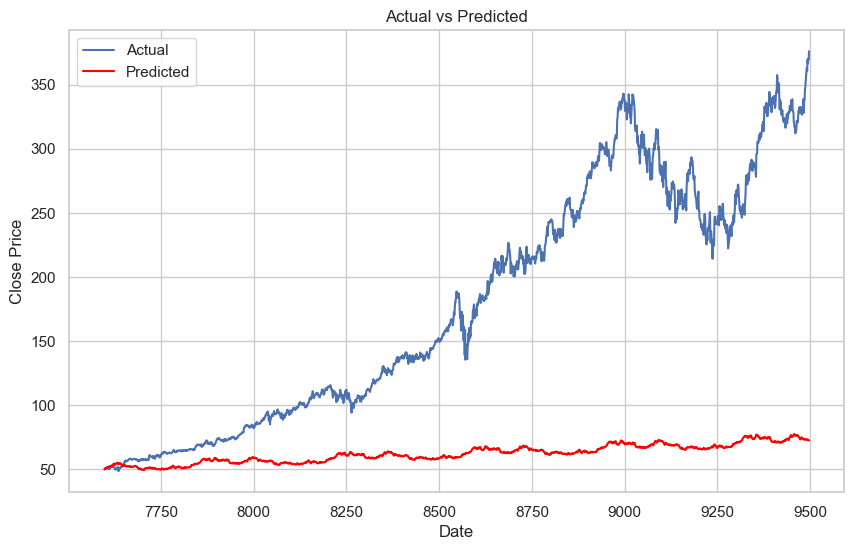

In [197]:
# Plotting the actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.plot(test_data_driven.index, test_data_driven['Close'], label='Actual')
plt.plot(test_data_driven.index, pred_hwe_mul_add, color='red', label='Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs Predicted')
plt.legend()
plt.show()

In [198]:
compare_rmse.append({'Holts winter exponential smoothing with multiplicative seasonality and additive trend':rmse_model_mul_add_1})

# final model: Holts winter exponential smoothing with multiplicative seasonality and additive trend
* Final Model by combining train and test

In [199]:
hwe_model_mul_add = ExponentialSmoothing(df1_data_driven["Close"],seasonal="mul",trend="add",seasonal_periods=730).fit() 


In [200]:
#Forecasting for next 730 time periods
future_pred=hwe_model_mul_add.forecast(521)
future_pred

9498     373.808633
9499     374.395835
9500     375.086222
9501     372.287958
9502     370.862980
            ...    
10014    432.664424
10015    428.945334
10016    423.915750
10017    417.235887
10018    416.120298
Length: 521, dtype: float64

In [201]:
df1_data_driven

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


<Axes: >

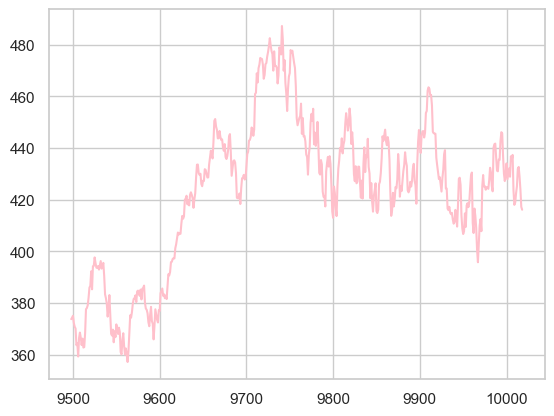

In [262]:
futuredate['Close'].plot(color='pink')

Text(0.5, 1.0, 'Holts winter exponential smoothing with multiplicative seasonality and additive trend with rmse = 143.57')

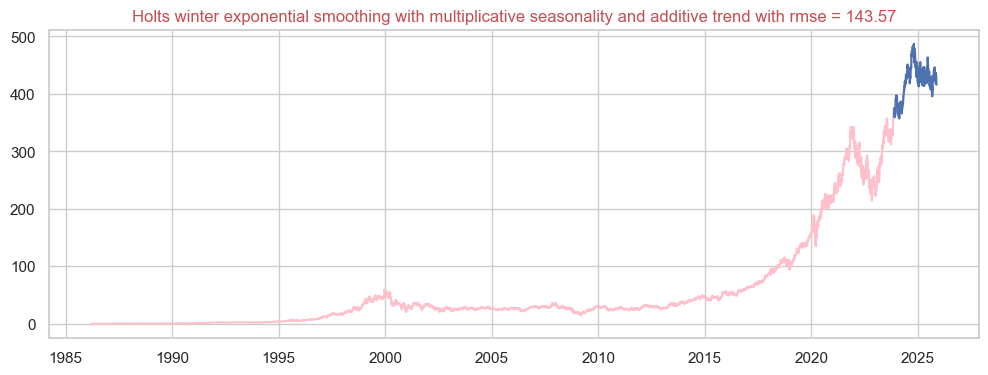

In [274]:
#futuredate=pd.DataFrame(pd.date_range(start='2023-11-17',end='2025-11-16',freq='B'),columns=['Date'])
#
futuredate=pd.DataFrame({'Date':pd.date_range(start='2023-11-17',end='2025-11-16',freq='B'),'Close':future_pred})


#

future_data_mul_add=pd.concat([df1_data_driven,futuredate])
future_data_mul_add.set_index('Date',inplace=True)
futuredate.set_index('Date',inplace=True)

plt.figure(figsize=(12,4))
plt.plot(future_data_mul_add['Close'],color='pink')
plt.plot(futuredate['Close'],color='b')
plt.title('Holts winter exponential smoothing with multiplicative seasonality and additive trend with rmse = 143.57',color='r')
#df1['Close'].plot(figsize=(12,4),color='pink')
#futuredate['Close'].plot(figsize=(12,4),color='pink')
#future_data['forecast'].plot(figsize=(8,3))

In [203]:
future_data_mul_add

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2025-11-10,432.664424
2025-11-11,428.945334
2025-11-12,423.915750


In [204]:
df1.reset_index()

,Date,Close
0,1986-03-13,0.097222
1,1986-03-14,0.100694
2,1986-03-17,0.102431
3,1986-03-18,0.099826
4,1986-03-19,0.098090
...,...,...
9493,2023-11-10,369.670013
9494,2023-11-13,366.679993
9495,2023-11-14,370.269989
9496,2023-11-15,369.670013


# Lstm

In [205]:
df1_lstm=df1.reset_index()
data_training_lstm=pd.DataFrame(df1_lstm['Close'][0:int(len(df1)*0.8)])
data_testing_lstm=pd.DataFrame(df1_lstm['Close'][int(len(df1)*0.8):int(len(df1))])

len(data_training_lstm),len(data_testing_lstm)

(7598, 1900)

In [206]:
data_training_lstm.head(2),data_testing_lstm.head(2)

(      Close
 0  0.097222
 1  0.100694,
           Close
 7598  49.779999
 7599  49.869999)

In [207]:
# Scaling with MinMaxScaler

In [208]:
scaler=MinMaxScaler(feature_range=(0,1))

In [209]:
data_training_array=scaler.fit_transform(data_training_lstm)
data_training_array

array([[1.16760405e-04],
       [1.75140607e-04],
       [2.04347496e-04],
       ...,
       [8.37529217e-01],
       [8.37024736e-01],
       [8.49467548e-01]])

In [210]:
data_training_array.shape

(7598, 1)

In [211]:
x_train=[]
y_train=[]
for i in range(200,data_training_array.shape[0]):
    x_train.append(data_training_array[i-200:i])
    y_train.append(data_training_array[i,0])

x_train

[array([[1.16760405e-04],
        [1.75140607e-04],
        [2.04347496e-04],
        [1.60545557e-04],
        [1.31355456e-04],
        [8.75703037e-05],
        [4.37851518e-05],
        [0.00000000e+00],
        [2.91901012e-05],
        [7.29752531e-05],
        [1.02165354e-04],
        [8.75703037e-05],
        [7.29752531e-05],
        [8.75703037e-05],
        [1.02165354e-04],
        [1.02165354e-04],
        [7.29752531e-05],
        [8.75703037e-05],
        [1.16760405e-04],
        [1.31355456e-04],
        [1.60545557e-04],
        [1.75140607e-04],
        [1.75140607e-04],
        [2.33537597e-04],
        [2.48132648e-04],
        [1.89752445e-04],
        [1.89752445e-04],
        [1.60545557e-04],
        [1.67843019e-04],
        [3.35702951e-04],
        [4.52480144e-04],
        [4.52488537e-04],
        [4.08678204e-04],
        [3.64893053e-04],
        [3.35702951e-04],
        [3.35702951e-04],
        [3.21107901e-04],
        [3.35702951e-04],
        [3.3

In [212]:
x_train, y_train= np.array(x_train), np.array(y_train)


In [213]:
x_train.shape

(7398, 200, 1)

In [214]:
#ML Model

In [215]:
model_lstm=Sequential()
model_lstm.add(LSTM(units=50,activation='relu',return_sequences=True, input_shape=(x_train.shape[1],1)))
model_lstm.add(Dropout(0.2))

model_lstm=Sequential()
model_lstm.add(LSTM(units=60,activation='relu',return_sequences=True))
model_lstm.add(Dropout(0.3))

model_lstm=Sequential()
model_lstm.add(LSTM(units=80,activation='relu',return_sequences=True))
model_lstm.add(Dropout(0.4))

model_lstm=Sequential()
model_lstm.add(LSTM(units=120,activation='relu'))
model_lstm.add(Dropout(0.5))

model_lstm.add(Dense(units=1))

model_lstm.compile(loss='mean_squared_error',optimizer='adam')

In [216]:
model_lstm.fit(x_train,y_train,epochs=100)

Epoch 1/100
232/232 [==============================] - 46s 183ms/step - loss: 0.0109
Epoch 2/100
232/232 [==============================] - 39s 168ms/step - loss: 0.0042
Epoch 3/100
232/232 [==============================] - 40s 170ms/step - loss: 0.0033
Epoch 4/100
232/232 [==============================] - 39s 169ms/step - loss: 0.0030
Epoch 5/100
232/232 [==============================] - 40s 171ms/step - loss: 0.0027
Epoch 6/100
232/232 [==============================] - 45s 194ms/step - loss: 0.0026
Epoch 7/100
232/232 [==============================] - 42s 182ms/step - loss: 0.0026
Epoch 8/100
232/232 [==============================] - 40s 173ms/step - loss: 0.0025
Epoch 9/100
232/232 [==============================] - 40s 173ms/step - loss: 0.0025
Epoch 10/100
232/232 [==============================] - 40s 174ms/step - loss: 0.0023
Epoch 11/100
232/232 [==============================] - 40s 172ms/step - loss: 0.0024
Epoch 12/100
232/232 [==============================] - 40s 174

232/232 [==============================] - 41s 178ms/step - loss: 0.0021
Epoch 97/100
232/232 [==============================] - 40s 172ms/step - loss: 0.0022
Epoch 98/100
232/232 [==============================] - 39s 169ms/step - loss: 0.0021
Epoch 99/100
232/232 [==============================] - 40s 171ms/step - loss: 0.0021
Epoch 100/100
232/232 [==============================] - 39s 169ms/step - loss: 0.0022


In [217]:
model_lstm.save('keras_model.h5')

In [219]:
data_testing_lstm.head()

,Close
7598,49.779999
7599,49.869999
7600,49.939999
7601,50.389999
7602,50.070000


In [220]:
past_200_days=data_training_lstm.tail(200)

In [221]:
final_df_lstm=past_200_days.append(data_testing_lstm,ignore_index=True)

In [222]:
input_data=scaler.fit_transform(final_df_lstm)

In [223]:
input_data.shape

(2100, 1)

In [224]:
x_test=[]
y_test=[]
for i in range(200,input_data.shape[0]):
    x_test.append(input_data[i-200:i])
    y_test.append(input_data[i,0])
x_test,y_test=np.array(x_test),np.array(y_test)

x_pred=[]
y_pred=[]
for for i in range(200,input_data.shape[0]):
    x_test.append(input_data[i-200:i])
    y_test.append(input_data[i,0])
x_test,y_test=np.array(x_test),np.array(y_test)

In [225]:
x_test.shape,y_test.shape

((1900, 200, 1), (1900,))

In [226]:
#making predictions
y_predicted=model_lstm.predict(x_test)

60/60 [==============================] - 5s 72ms/step


In [227]:
scaler.scale_

array([0.00297885])

In [228]:
scale_factor=1/scaler.scale_
y_predicted=y_predicted*scale_factor
y_test=y_test*scale_factor

In [229]:
y_test.shape,x_test.shape

((1900,), (1900, 200, 1))

In [230]:
y_test,x_test

(array([  9.30999756,   9.39999771,   9.46999741, ..., 329.79998779,
        329.20001221, 335.70001221]),
 array([[[0.01831992],
         [0.01921357],
         [0.02028596],
         ...,
         [0.02809056],
         [0.02800118],
         [0.03020554]],
 
        [[0.01921357],
         [0.02028596],
         [0.01510277],
         ...,
         [0.02800118],
         [0.03020554],
         [0.02773309]],
 
        [[0.02028596],
         [0.01510277],
         [0.01680071],
         ...,
         [0.03020554],
         [0.02773309],
         [0.02800118]],
 
        ...,
 
        [[0.60244265],
         [0.61763476],
         [0.63235029],
         ...,
         [0.95388737],
         [0.98063747],
         [0.97173065]],
 
        [[0.61763476],
         [0.63235029],
         [0.66764968],
         ...,
         [0.98063747],
         [0.97173065],
         [0.98242471]],
 
        [[0.63235029],
         [0.66764968],
         [0.64903186],
         ...,
         [0.97173065

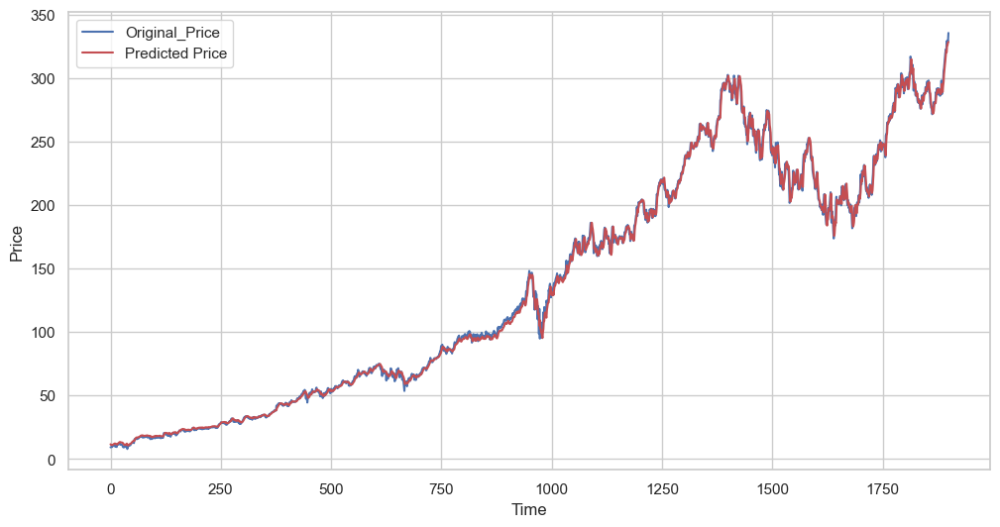

In [231]:
plt.figure(figsize=(12,6))
plt.plot(y_test,'b',label='Original_Price')
plt.plot(y_predicted,'r',label='Predicted Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

In [232]:
# report performance
rmse_lstm = np.sqrt(mean_squared_error(y_test, y_predicted))
print('RMSE: %.3f' % rmse_lstm)

RMSE: 3.792


In [233]:
compare_rmse.append({'LSTM':rmse_lstm})

In [234]:
compare_rmse

[{'Arima': 3.5199589710208112},
 {'fbprophet': 140.59321778108063},
 {'autoregressive model': 163.3197636118318},
 {'Simple Exponential': 156.6271276229572},
 {'Holt': 154.71704324074835},
 {'Exponential with Additive Seasonality and Additive Trend': 150.6833877443038},
 {'Holts winter exponential smoothing with multiplicative seasonality and additive trend': 143.56858960303728},
 {'LSTM': 3.7920379374959747}]

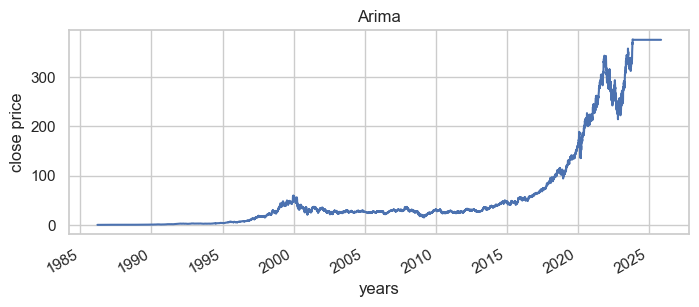

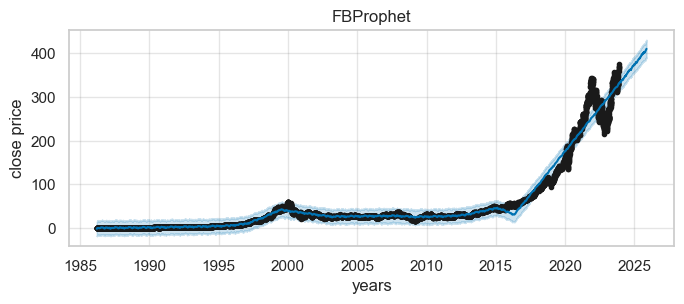

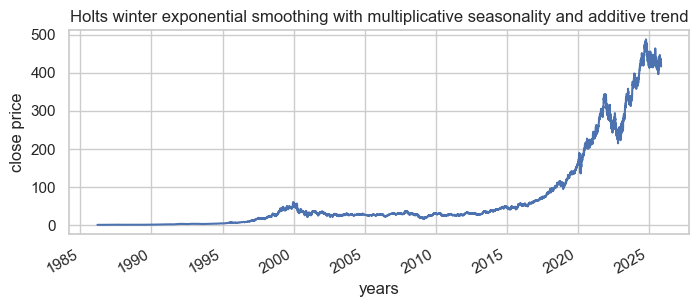

In [235]:

future_data_Arima['Close'].plot(figsize=(8,3))
plt.xlabel('years')
plt.ylabel('close price')
plt.title('Arima')
plt.show()
model_prophet_full.plot(prediction_prophet,figsize=(7,3))
plt.xlabel('years')
plt.ylabel('close price')
plt.title('FBProphet')
plt.show()
future_data_mul_add['Close'].plot(figsize=(8,3))
plt.xlabel('years')
plt.ylabel('close price')
plt.title('Holts winter exponential smoothing with multiplicative seasonality and additive trend')
plt.show()


# final Model:

 * with rmse of 3.52  model ARIMA is performing best for the dataset

# model name: model_arima_4

In [238]:
# predicted data
futuredate_arima

,Close
Date,
2023-11-17,375.541208
2023-11-18,375.368985
2023-11-19,375.343944
2023-11-20,375.340302
2023-11-21,375.339773
...,...
2025-11-11,375.339683
2025-11-12,375.339683
2025-11-13,375.339683


Text(0.5, 1.0, 'Arima with rmse = 3.52')

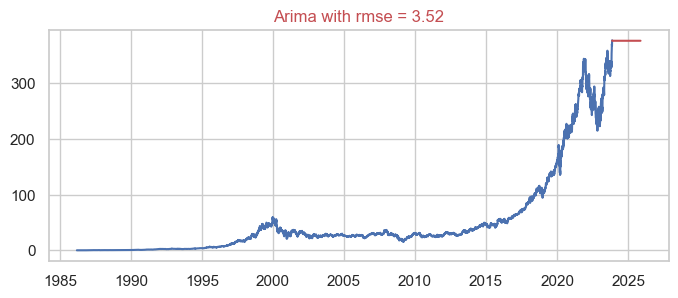

In [275]:
#plt.figure(figsize=(8,3))
#plt.plot(df1['Close'],color='r')
#plt.plot(future_data_Arima,color='b',linestyle=':')

plt.figure(figsize=(8,3))
plt.plot(df1['Close'],color='b')
plt.plot(futuredate_arima,color='r')
plt.title('Arima with rmse = 3.52',color='r')
#df1['Close'].plot(figsize=(8,3),color='r')
#future_data_Arima.plot(figsize=(8,3))

In [250]:
df1

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2023-11-10,369.670013
2023-11-13,366.679993
2023-11-14,370.269989


In [251]:
# saving data
df1.to_csv('Cleaned_Data.csv')


# saving the model

In [254]:
filename='trained_model.sav'
pickle.dump(model_arima_4,open(filename,'wb'))#writing the binary format


# testing with loaded model

In [255]:
# loading the saved model
loaded_model=pickle.load(open('trained_model.sav','rb'))#rb=reading binabry format

In [256]:
ypred_=loaded_model.predict(start=7599,end=9497)

In [257]:
# report performance
rmse_loaded_model = np.sqrt(mean_squared_error(test_arima, ypred_))
print('RMSE: %.3f' % rmse_loaded_model)


RMSE: 3.520


In [258]:
ypred_future=loaded_model.predict(start=9498,end=10227)

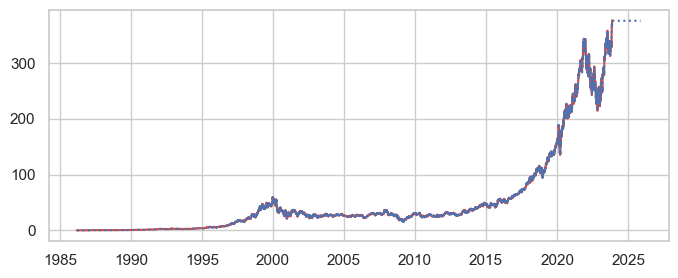

In [276]:
futuredate_arima_loaded=pd.DataFrame({'Close':ypred_future})

futuredate_arima_loaded['Date']=pd.date_range(start='2023-11-17',end='2025-11-15')

futuredate_arima_loaded.set_index('Date',inplace=True)

future_data_Arima_loaded=pd.concat([df1,futuredate_arima_loaded])

plt.figure(figsize=(8,3))
plt.plot(df1['Close'],color='r')
plt.plot(future_data_Arima_loaded,color='b',linestyle=':')

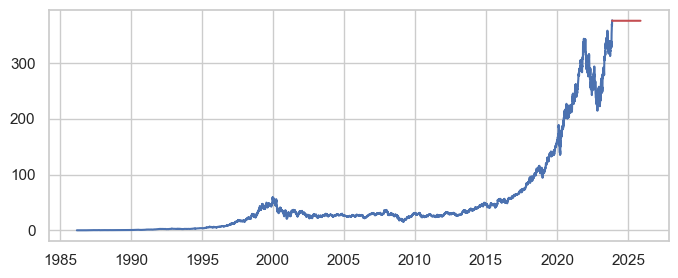

In [266]:
plt.figure(figsize=(8,3))
plt.plot(df1['Close'],color='b')
plt.plot(futuredate_arima_loaded,color='r')

In [277]:
df1

,Close
Date,
1986-03-13,0.097222
1986-03-14,0.100694
1986-03-17,0.102431
1986-03-18,0.099826
1986-03-19,0.098090
...,...
2023-11-10,369.670013
2023-11-13,366.679993
2023-11-14,370.269989
